<a href="https://colab.research.google.com/github/diwankar12/AI-ML/blob/feature%2Fproject3/ETMT_Project_LearnerNotebook_FullCode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [1]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To tune model, get different metric scores, and split data
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
#    plot_confusion_matrix,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings
from xgboost import XGBClassifier
from sklearn import metrics

warnings.filterwarnings("ignore")

## Loading the dataset

In [2]:
from google.colab import drive
drive.mount('/content/drive')

# read the data
df_main = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data/BankChurners.csv')
# returns the first 5 rows
df_main.head()

Mounted at /content/drive


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [3]:
df = df_main.copy()

In [4]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


## Data Overview

- Observations
- Sanity checks

## Sanity Checks - Displaying first/last rows , shape and data types

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

Observations

* Total 10127 rows
*  education_level and marital_status has some missing values .
* Attrition_Flag,Gender, education_level , marital_status , income category and card category has object data types .

In [6]:
df.shape

(10127, 21)

Observations

* Total 10127 rows and 21 columns  

In [7]:
df.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [8]:
df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


# Checking Duplicate and missing values

In [9]:
df.duplicated().sum()

0

Observations

There is no duplicate values in the data

In [10]:
df.isna().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [11]:
df.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

Observations :

There are null values present for education_level (1519) and Marital_Status (749) in the dataset

# Statistical Summary

In [12]:
# CLIENTNUM consists of uniques ID for clients and hence will not add value to the modeling
df.drop(["CLIENTNUM"], axis=1, inplace=True)

In [13]:
for i in df.describe(include=["object"]).columns:
    print("Unique values in", i, "are :")
    print(df[i].value_counts())
    print("*" * 50)

Unique values in Attrition_Flag are :
Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
**************************************************
Unique values in Gender are :
F    5358
M    4769
Name: Gender, dtype: int64
**************************************************
Unique values in Education_Level are :
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
**************************************************
Unique values in Marital_Status are :
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
**************************************************
Unique values in Income_Category are :
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
**************************************************

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000
Total_Amt_Chng_Q4_Q1,10127.000,0.760,0.219,0.000,0.631,0.736,0.859,3.397


Observations

*   Customer Age Range from 26 to 73 .
*   Dependent_count range from 0-5 .





In [15]:
## Encoding Existing and Attrited customers to 0 and 1 respectively, for analysis.
df["Attrition_Flag"].replace("Existing Customer", 0, inplace=True)
df["Attrition_Flag"].replace("Attrited Customer", 1, inplace=True)

* Replaced existing customer to 0 and attrited customer to 1

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [16]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [17]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [18]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [19]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

# Univariate Analysis

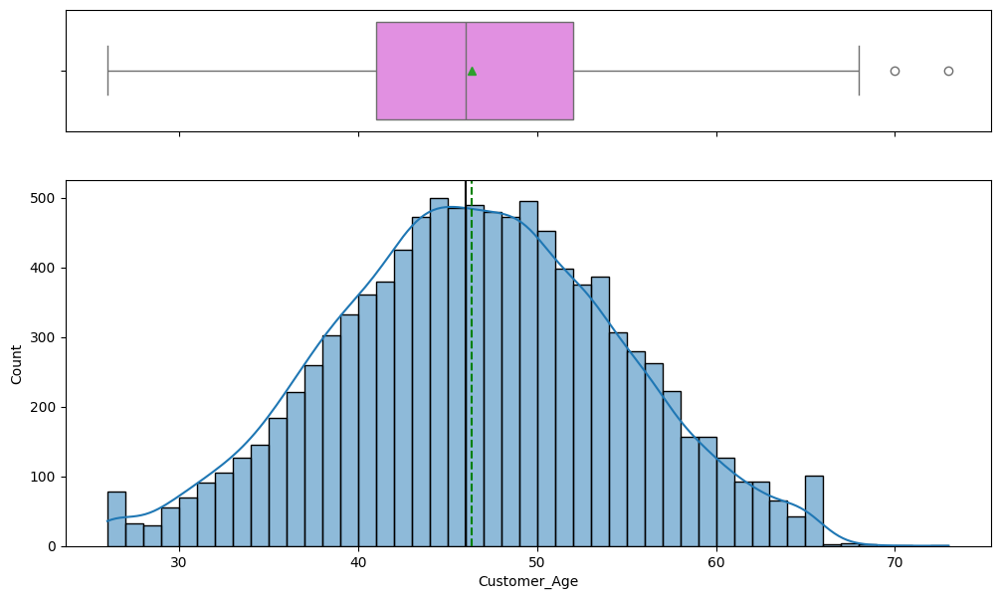

In [20]:
histogram_boxplot(df, "Customer_Age", kde=True)

Observations

* Customer age is looking normally distributed with slightly  of right skewed

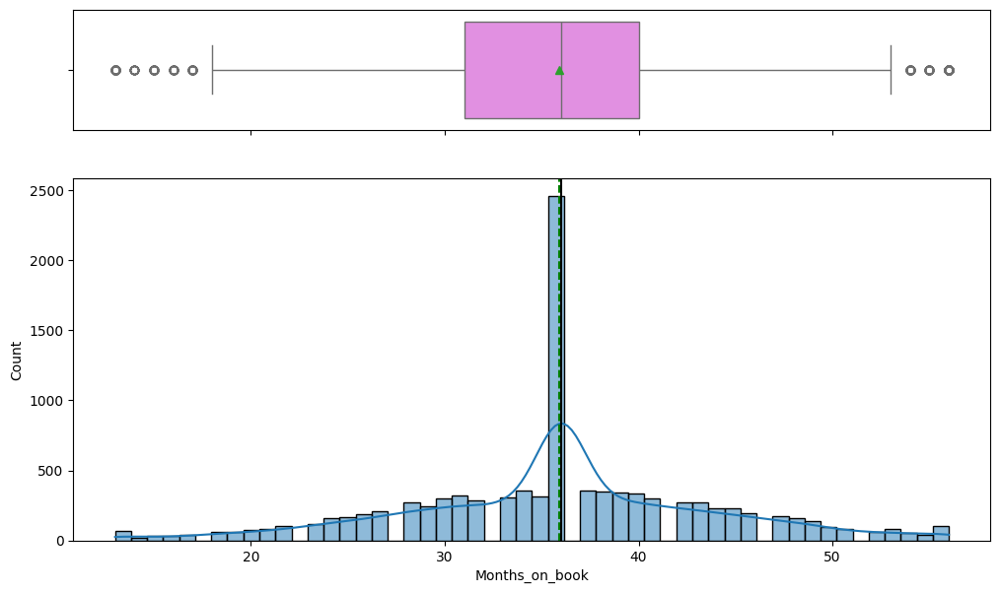

In [21]:
histogram_boxplot(df, "Months_on_book", kde=True)

* Mean and median is almost same .
* Months on books less than ~15 and more than ~53 are outliers
* This distribution has peak at ~35 . Period of relationship with bank for most of the customers(2300) is ~35 months .


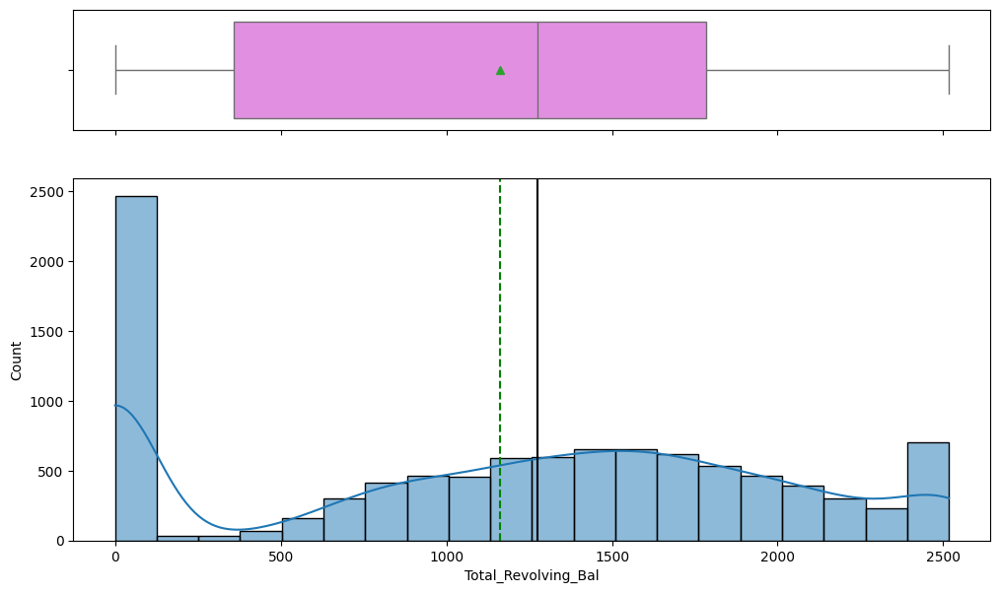

In [22]:
histogram_boxplot(df, "Total_Revolving_Bal", kde=True)

* Median is greater than mean here which means that the distribution is left skewed .
* For almost 2300 customers pay the balance in full every month .
* There are two peaks one at 0 and 2500 .

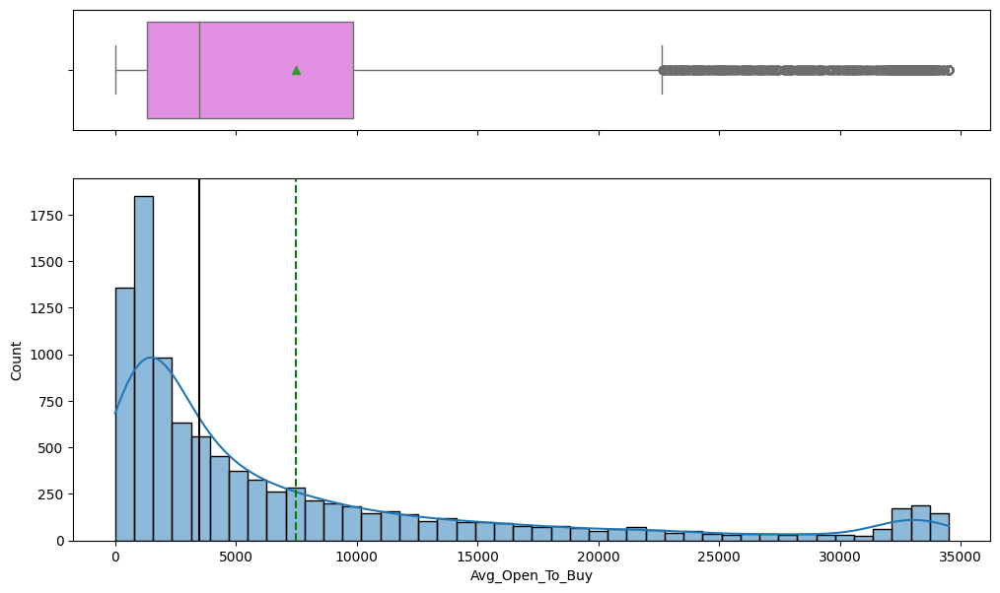

In [23]:
histogram_boxplot(df, "Avg_Open_To_Buy", kde=True)

* From the boxplot, we can see that avg open to buy with more than ~22000 are outliers.
* Mean is greater than median which means that the distribution is right skewed .

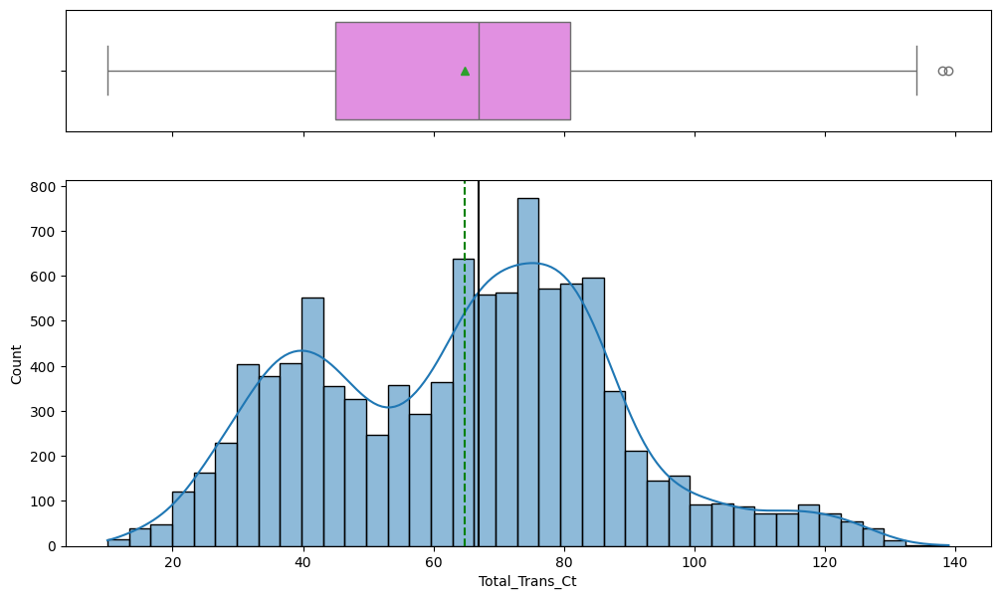

In [24]:
histogram_boxplot(df, "Total_Trans_Ct", kde=True)

* Above histplot shows that the distribution is left skewed
* Few outliers are present that has total transaction count greater than 135 .

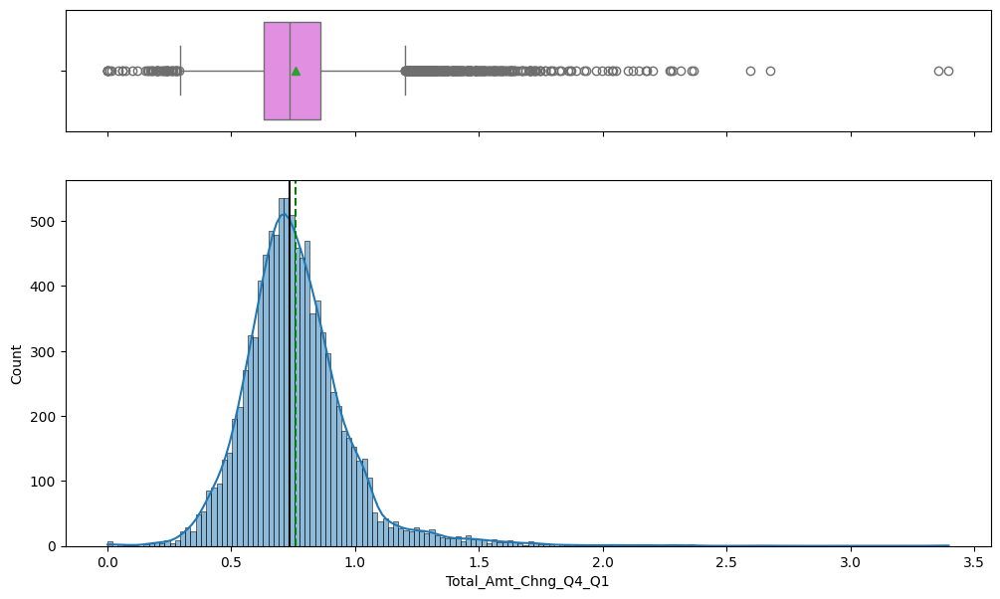

In [25]:
histogram_boxplot(df, "Total_Amt_Chng_Q4_Q1", kde=True)

* There are lot of outliers present on both sides change in Transaction Amount (Q4 over Q1) less than ~0.3 and greater than ~1.3 .
* Mean is greater than median had a hint of right skew

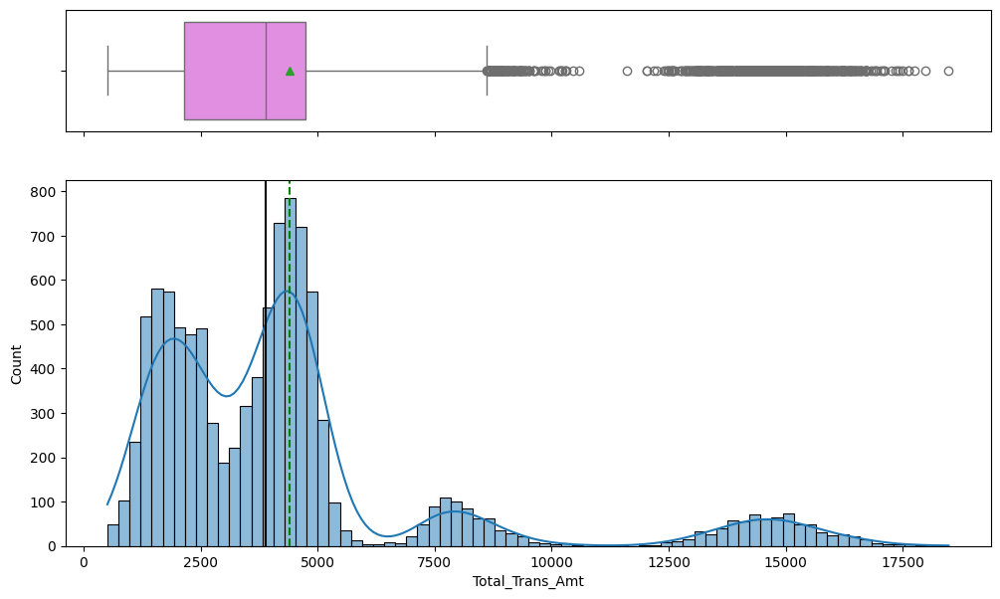

In [26]:
histogram_boxplot(df, "Total_Trans_Amt", kde=True)

* Histplot shows Right skewed distribution
* From the boxplot, we can observe that this variable contains outliers also greater than ~7700

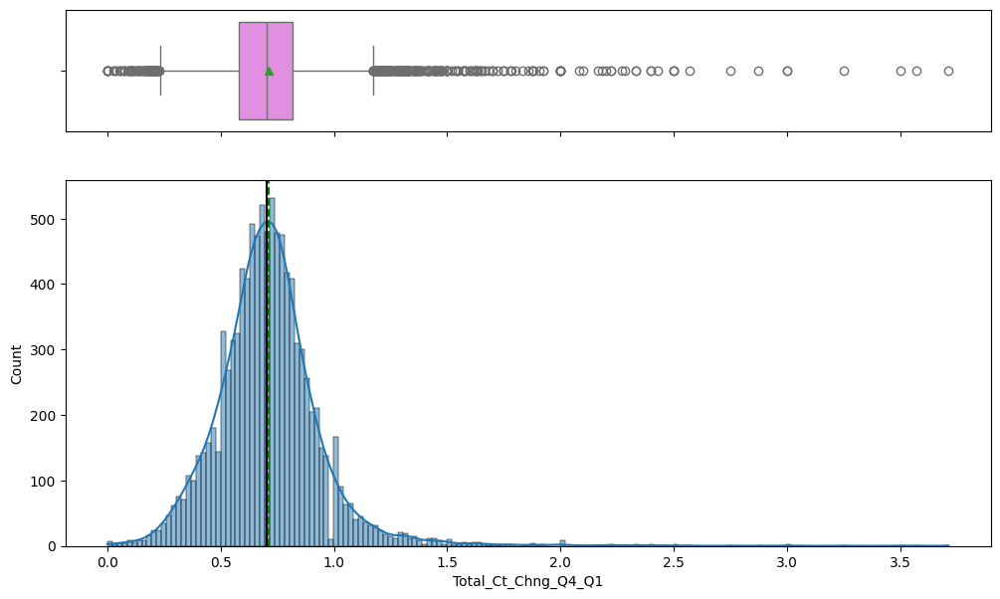

In [27]:
histogram_boxplot(df, "Total_Ct_Chng_Q4_Q1", kde=True)

* Change in Transaction Count (Q4 over Q1)  has a uniform distribution with mean and median close to 0.7.
* outliers present on both sides change in Transaction Amount (Q4 over Q1) less than ~0.3 and greater than ~1.3 .

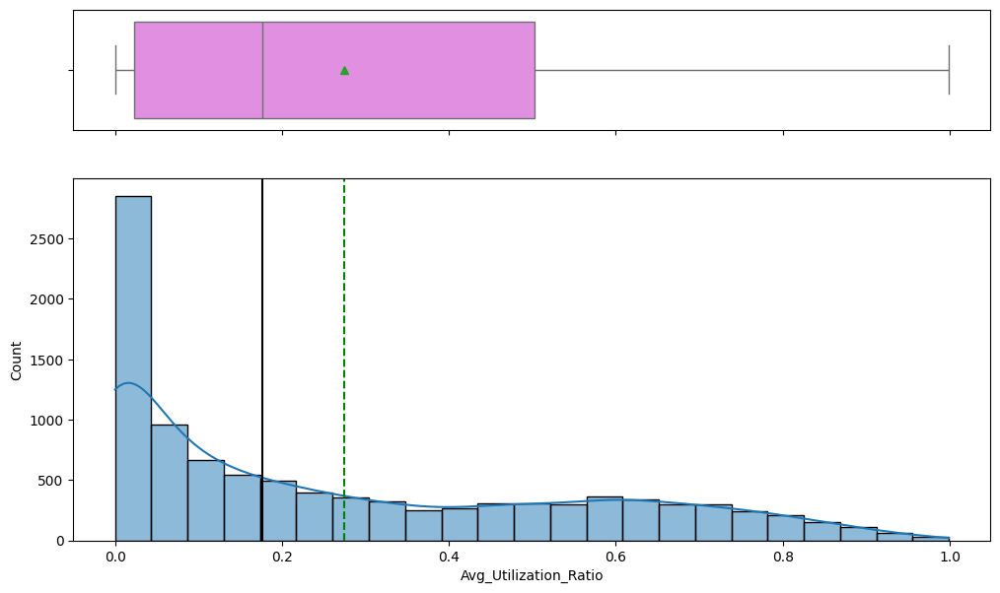

In [28]:
histogram_boxplot(df, "Avg_Utilization_Ratio", kde=True)

* Right skewed distribution
* Median is around 0.17 with mean 0.27
* Average utilization Ratio peak is 0 , which means most of the customer spent is 0 .

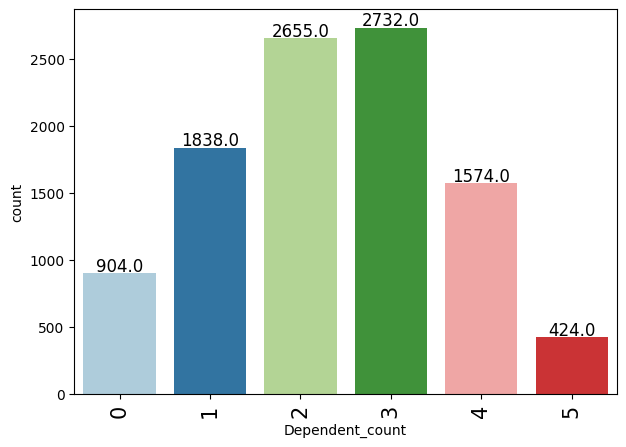

In [29]:
labeled_barplot(df, "Dependent_count")

* dependent count 3 , has the highest number 2732 followed by  dependent count 2 .

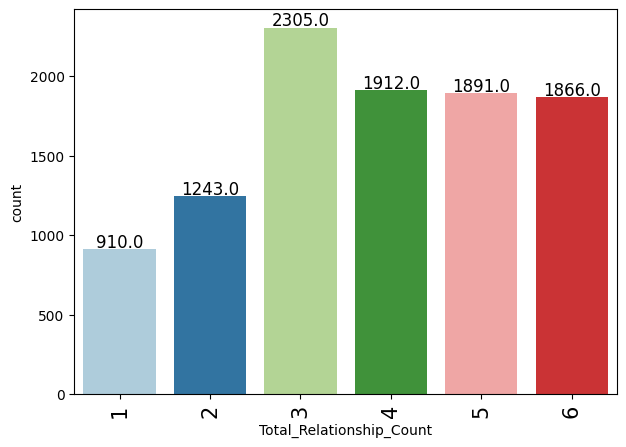

In [30]:
labeled_barplot(df, "Total_Relationship_Count")

* Toatal number of Customers holding three product is maximum which is 2305 .

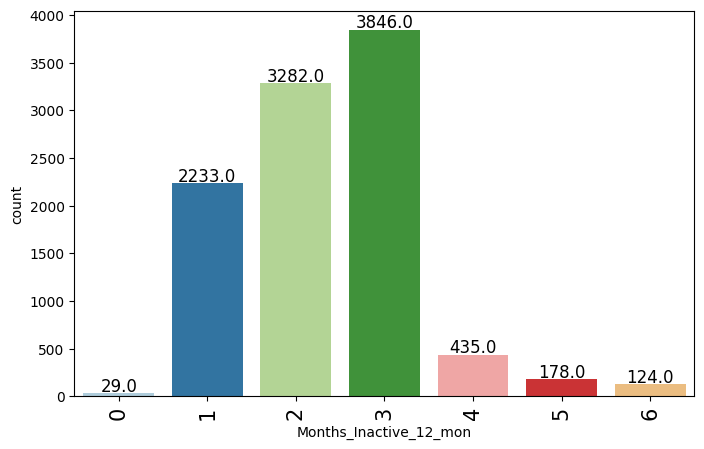

In [31]:
labeled_barplot(df, "Months_Inactive_12_mon")

* Around 3846 where inactive for 3 months out of 12 months .
* Only 29 customers were active throughout the year

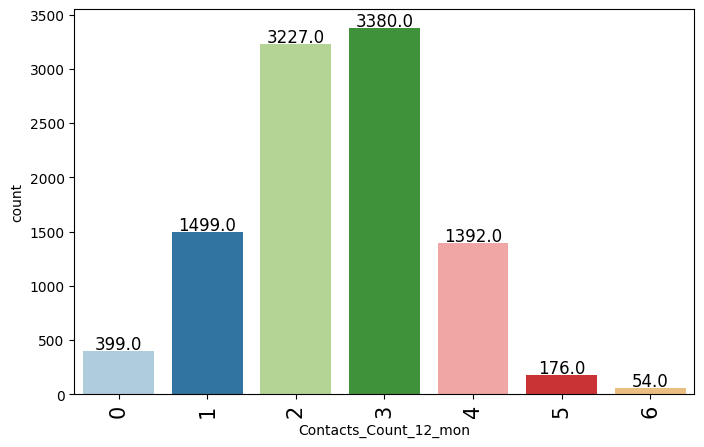

In [32]:
labeled_barplot(df, "Contacts_Count_12_mon")


* Three times customers contacted with the bank in the last 12 months is 3380 customers which is maximum


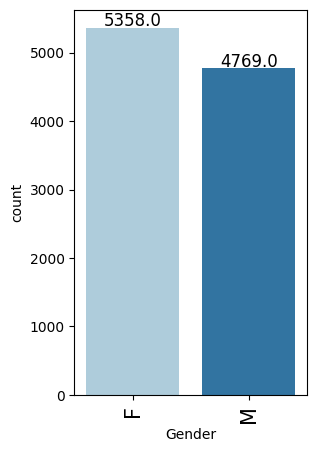

In [33]:
labeled_barplot(df, "Gender")

* There are more number of female customers than male .

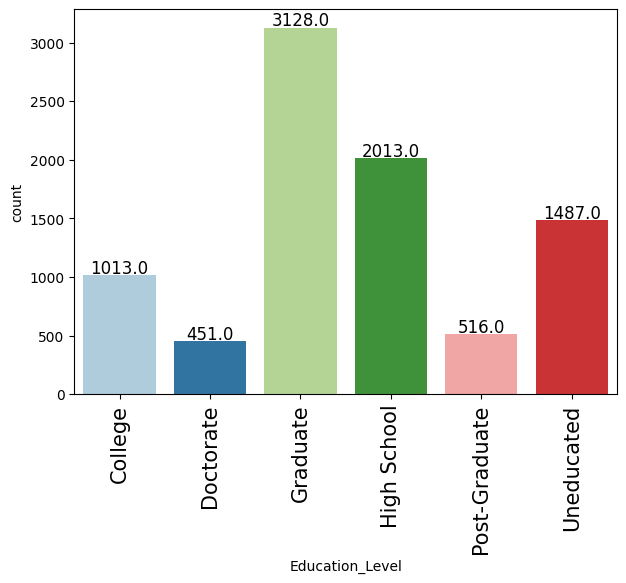

In [34]:
labeled_barplot(df, "Education_Level")

* Most of the customers are graduate around 3128 followed by high school 2013


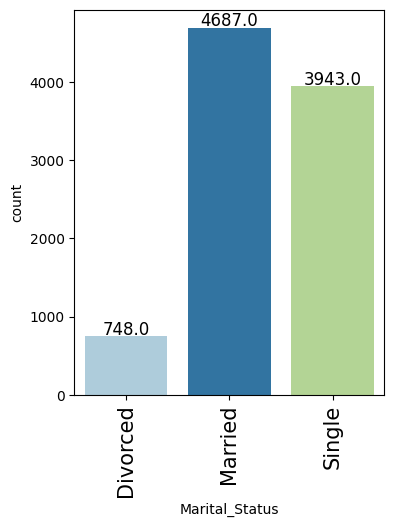

In [35]:
labeled_barplot(df, "Marital_Status")

* Around 50% Customers are married and 42% are single

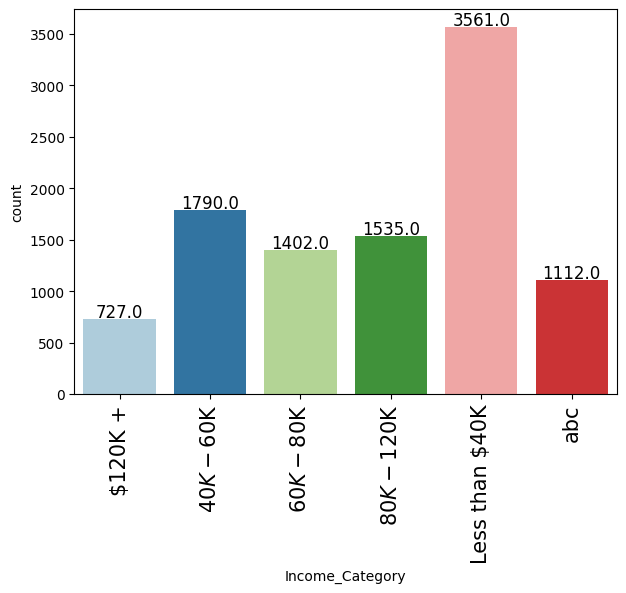

In [36]:
labeled_barplot(df, "Income_Category")

* Around 35% of customers has income less than $40k .
* Followed by 17% of customers (1790) has income ranges between 40k to 60k

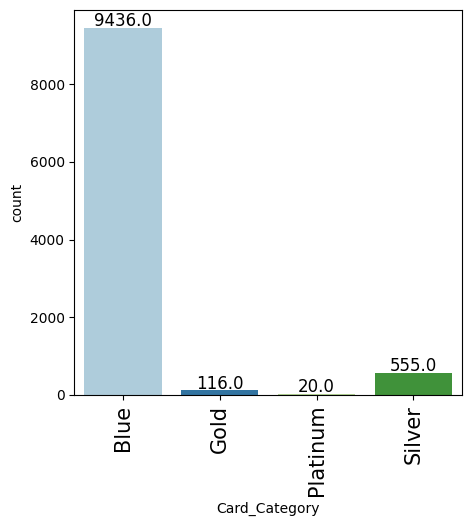

In [37]:
labeled_barplot(df, "Card_Category")

* Most customers 9436 has blue card .
* 2% customers ~20 has platinum card

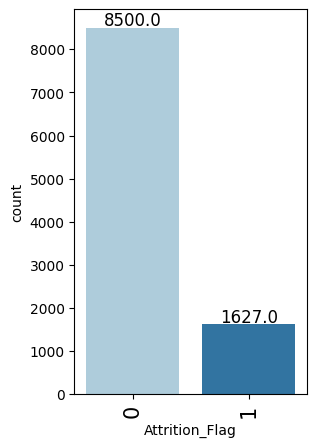

In [38]:
labeled_barplot(df, "Attrition_Flag")

* 16% of the data points represent the customers who are going to attrite.

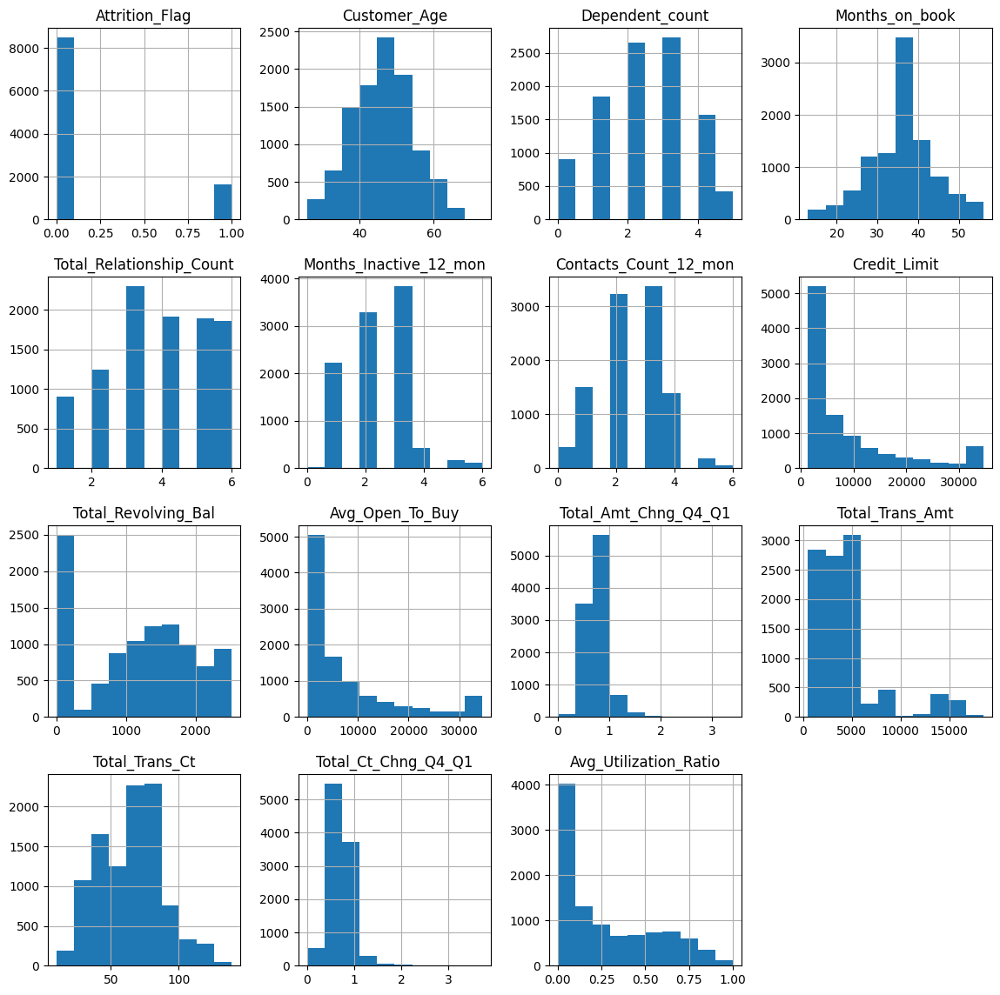

In [39]:
df.hist(figsize=(14, 14))
plt.show()

* `Attrition`: There's an imbalance in the data with 16% of the employees attriting and rest not.
* `Customer age`: The variable Customer Age is normally distributed with an average equal to 46 years.
* `Dependent Count`: Dependent count 3 , has the highest number 2732 followed by dependent count 2 .
* `Months on Book`: It is an almost uniformly distributed variable. It has mean and median approx equal to 36.
* `Total Relationship Count`:Total Relationship Count distribution is almost left-skewed. Highest number of products held by customer is three followed by 4.
* `Months Inactive 12 month `: This distribution is right skewed . Highest Number of inactive in the last 12 months is 3 .
* `Contacts count 12 month`: It has a right-skewed distribution variable with a median close to 2.
* `Credit Limit`: On average people have credit limit at 8632  with a median of 4529 . The majority of customers approx 3000. It doesn't seems to effect attrition
* `Total Revolving balance`:  It has a right-skewed distribution. It is correlated with performance rating with a coefficient of 0.77. Lesser salary hike also contributes to attrition.
* `Avg Open to buy`: Work experience is having a significant right skew. It also contains few outliers.
* `Total Amount change q4 to q1`: Significantly skewed towards the right. Also contains outliers.
* `Total Transaction Amount`: It is having few outliers. The lower whisker coincides with the first quartile.
* `Total Transaction count`: It is a right-skewed variable with few outliers too.
* `Total Count change q4 to q1`: Almost 71% of employees have travel rarely and 19% travel frequently. As the travel frequency increases of an employee increases, the Attrition rate increases. There's a ~22% probability of employees attriting who travel frequently.
* `Avg Utilization Ratio`: The R&D department consists of almost 65% of employees.




# Bivariate Analysis


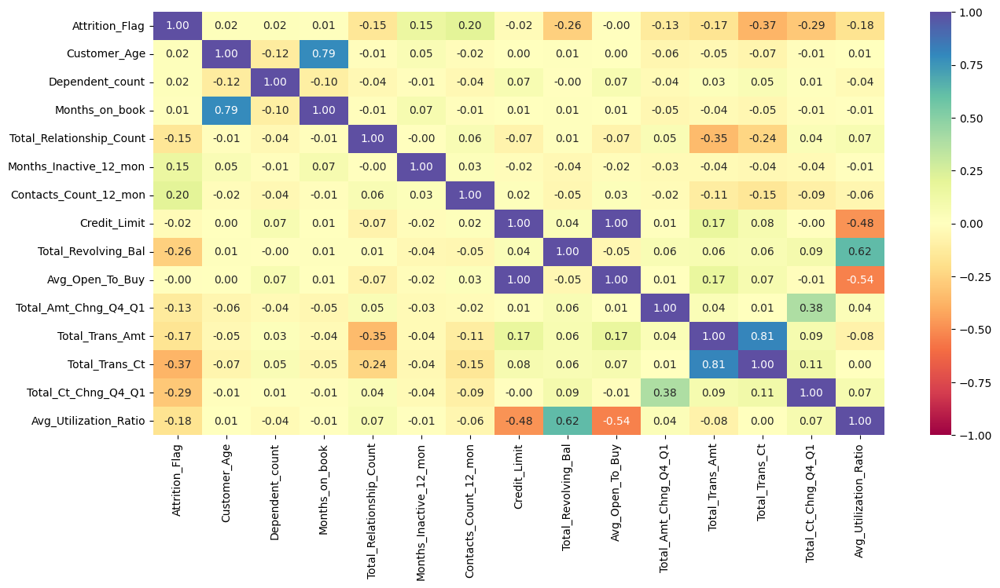

In [40]:
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

* Customer Age and months on book is highly correlated .
* Unsurprisingly, Total_revolving balance is postively correlated to Avg Utilization ratio .
*  Total transaction count and total transaction amount are highly correlated to each other
* Avg utilization ratio is negatively correlated to avg pen to buy and credit limit .

Attrition_Flag     0     1    All
Gender                           
All             8500  1627  10127
F               4428   930   5358
M               4072   697   4769
------------------------------------------------------------------------------------------------------------------------


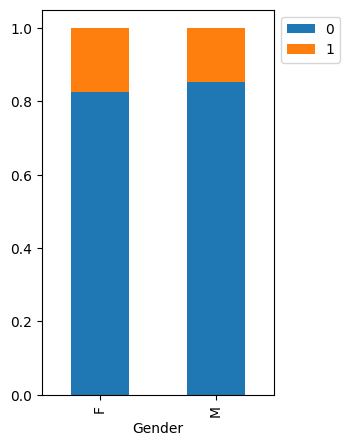

In [41]:
stacked_barplot(df, "Gender", "Attrition_Flag")

* ~17% females had attrite which is more compared to 14% of male .

Attrition_Flag     0     1   All
Marital_Status                  
All             7880  1498  9378
Married         3978   709  4687
Single          3275   668  3943
Divorced         627   121   748
------------------------------------------------------------------------------------------------------------------------


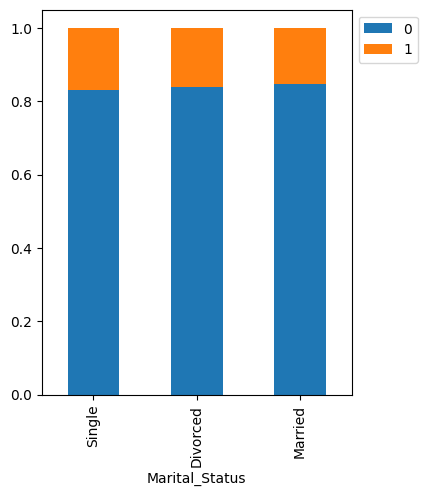

In [42]:
stacked_barplot(df ,"Marital_Status" , "Attrition_Flag")

*  Almost 18% of divorced people attrite compared to 16% single and 15% married .

Attrition_Flag      0     1   All
Education_Level                  
All              7237  1371  8608
Graduate         2641   487  3128
High School      1707   306  2013
Uneducated       1250   237  1487
College           859   154  1013
Doctorate         356    95   451
Post-Graduate     424    92   516
------------------------------------------------------------------------------------------------------------------------


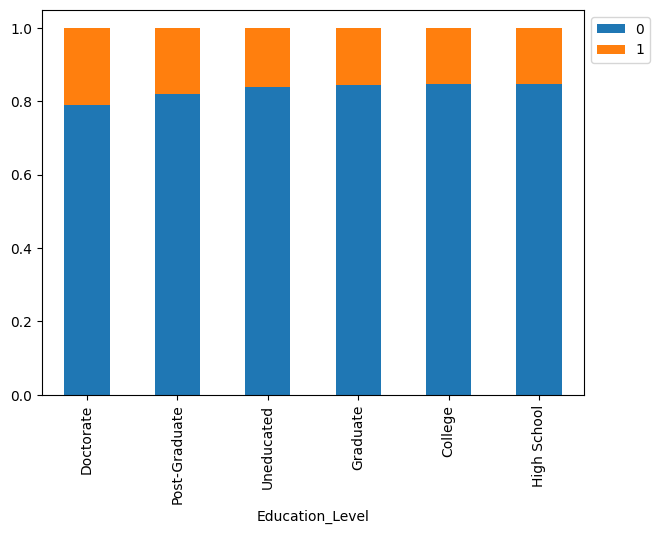

In [43]:
stacked_barplot(df ,"Education_Level" , "Attrition_Flag")

* Customers who has education levele as doctorate likely to attrite.
* There's a ~19% probability of attrition among Customers with  education levele as doctorate and post graduate .

Attrition_Flag      0     1    All
Income_Category                   
All              8500  1627  10127
Less than $40K   2949   612   3561
$40K - $60K      1519   271   1790
$80K - $120K     1293   242   1535
$60K - $80K      1213   189   1402
abc               925   187   1112
$120K +           601   126    727
------------------------------------------------------------------------------------------------------------------------


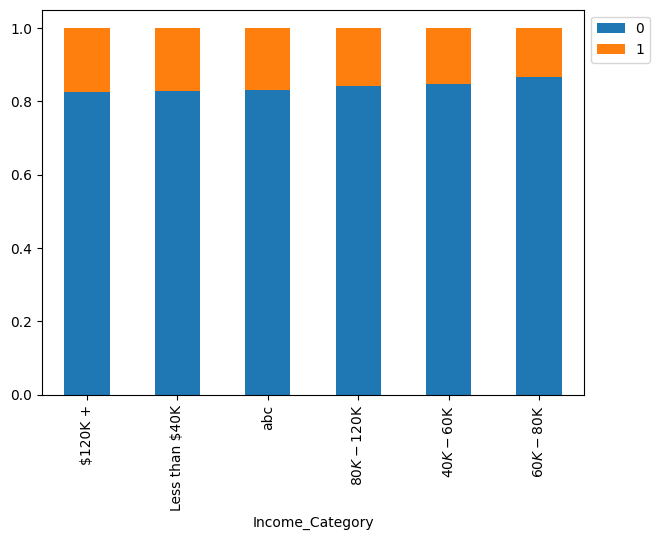

In [44]:
stacked_barplot(df ,"Income_Category" , "Attrition_Flag")

* Customers having income less than 40k tends to attrite more .
* Almost 17% of customers tends to attrite who falls in income level less than 40k


Attrition_Flag             0     1    All
Months_Inactive_12_mon                   
All                     8500  1627  10127
3                       3020   826   3846
2                       2777   505   3282
4                        305   130    435
1                       2133   100   2233
5                        146    32    178
6                        105    19    124
0                         14    15     29
------------------------------------------------------------------------------------------------------------------------


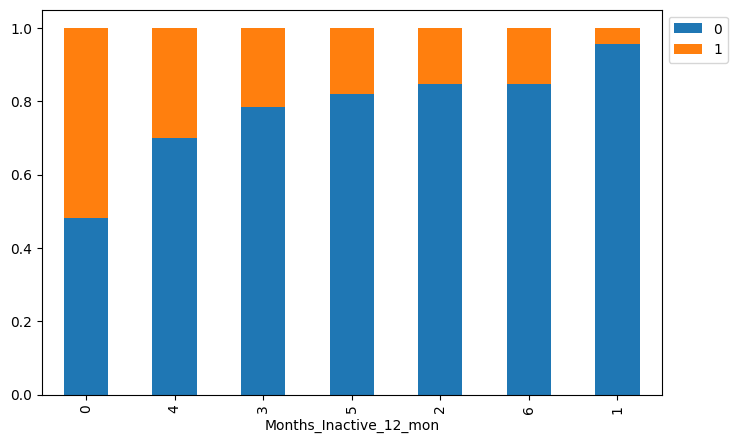

In [45]:
stacked_barplot(df ,"Months_Inactive_12_mon" , "Attrition_Flag")

* Customers who are always **active** in the last 12 months tends to attrite more

Attrition_Flag               0     1    All
Total_Relationship_Count                   
All                       8500  1627  10127
3                         1905   400   2305
2                          897   346   1243
1                          677   233    910
5                         1664   227   1891
4                         1687   225   1912
6                         1670   196   1866
------------------------------------------------------------------------------------------------------------------------


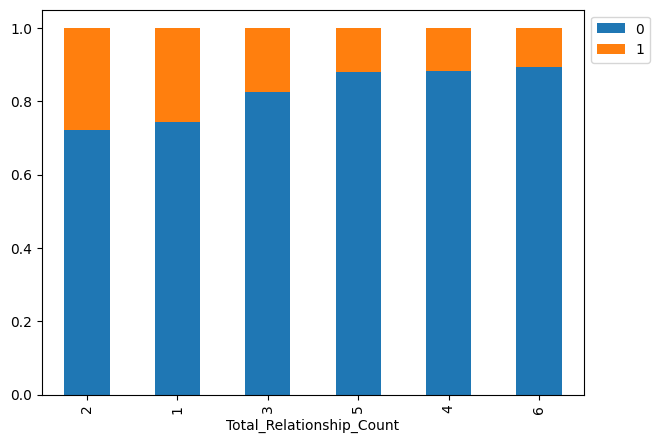

In [46]:
stacked_barplot(df ,"Total_Relationship_Count" , "Attrition_Flag")

* Customers who held 2 products tends to attrite more .


Attrition_Flag      0     1    All
Dependent_count                   
All              8500  1627  10127
3                2250   482   2732
2                2238   417   2655
1                1569   269   1838
4                1314   260   1574
0                 769   135    904
5                 360    64    424
------------------------------------------------------------------------------------------------------------------------


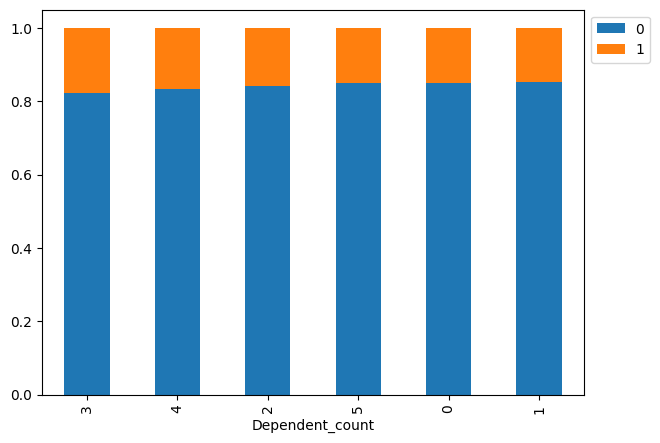

In [47]:
stacked_barplot(df ,"Dependent_count" , "Attrition_Flag")

* Customers who has Number of dependents equal to 3 , probablity of attrition is more compared to others

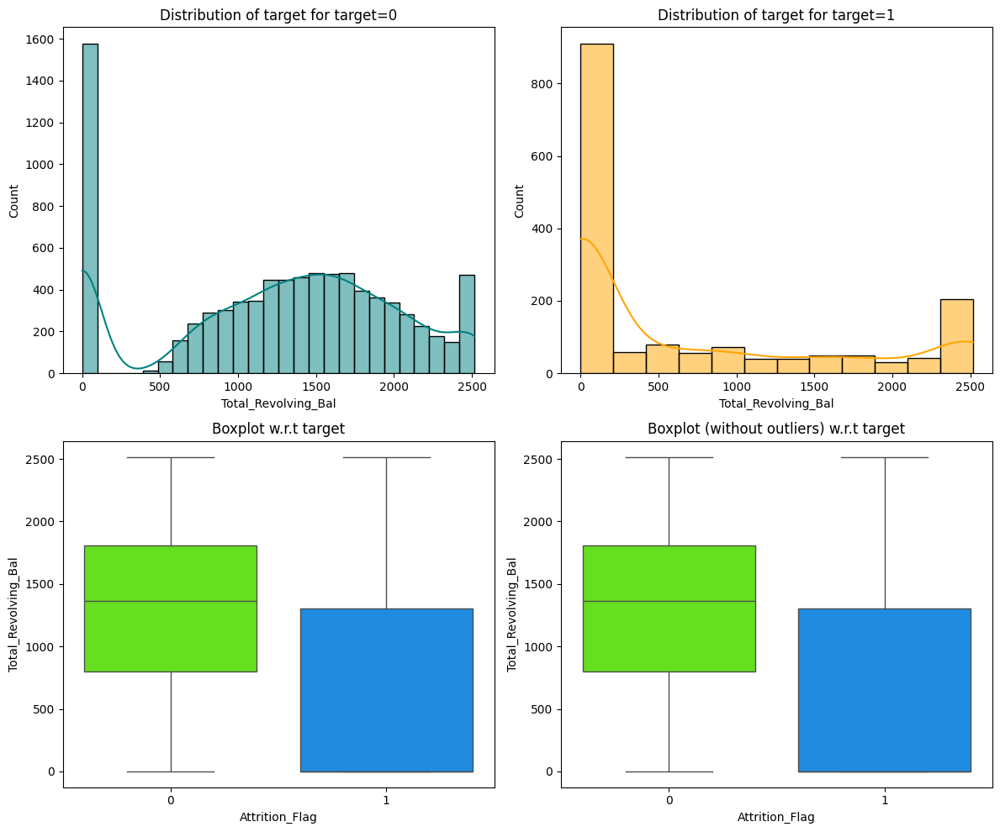

In [48]:
distribution_plot_wrt_target(df ,"Total_Revolving_Bal" , "Attrition_Flag")

* Customers who has high revolving balance would be less likely to attrite as compared to the customers who has less revolving balance.
* Customers who pays full balance of the revolving credit account is likely to attrite more .

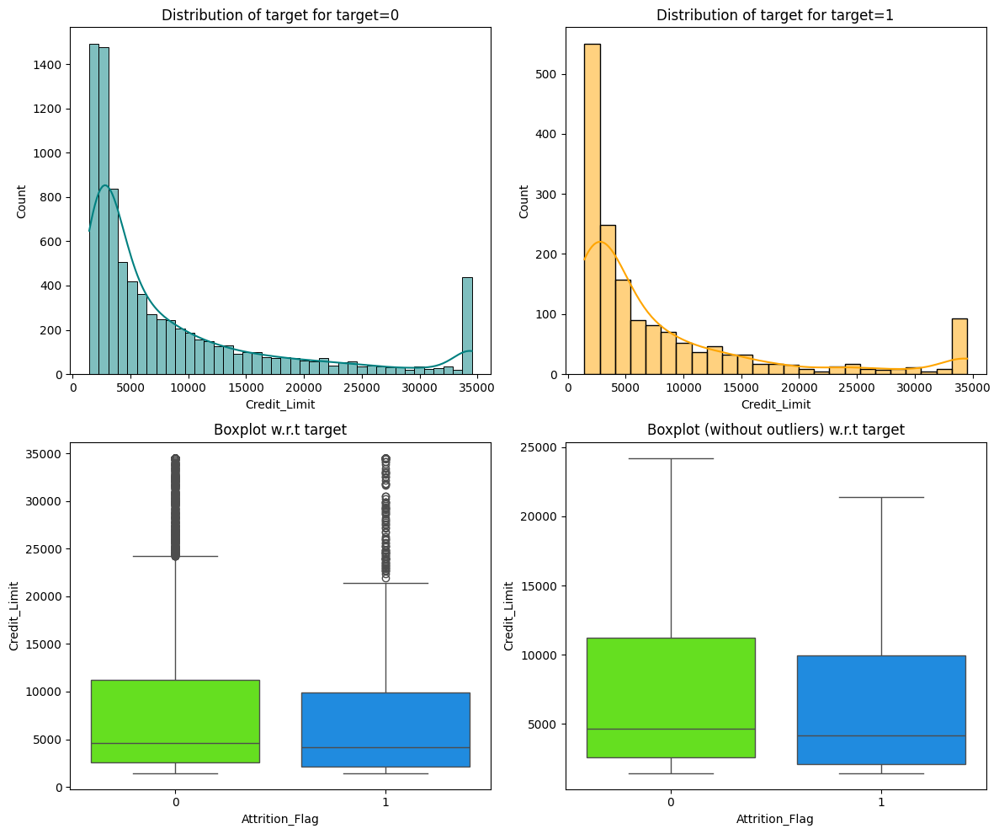

In [49]:
distribution_plot_wrt_target(df ,"Credit_Limit" , "Attrition_Flag")

* Credit limit don't seem to have any impact on the target variable.

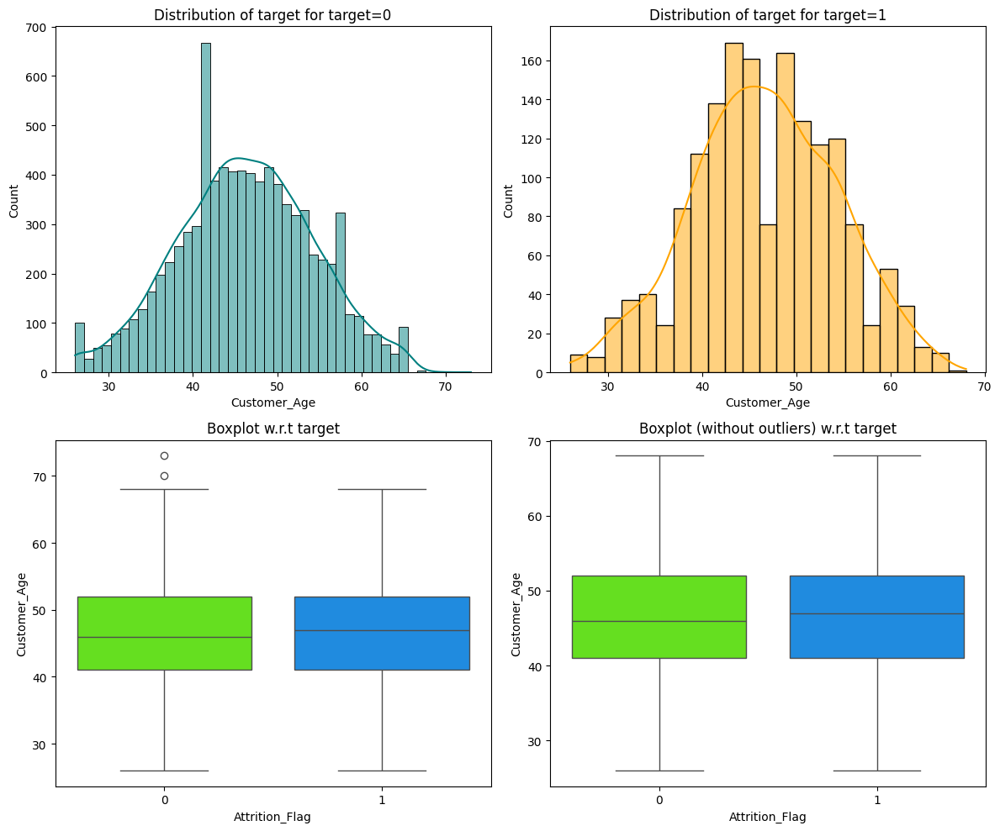

In [50]:
distribution_plot_wrt_target(df ,"Customer_Age" , "Attrition_Flag")

* Customer Age don't seem to have any impact on the target variable.

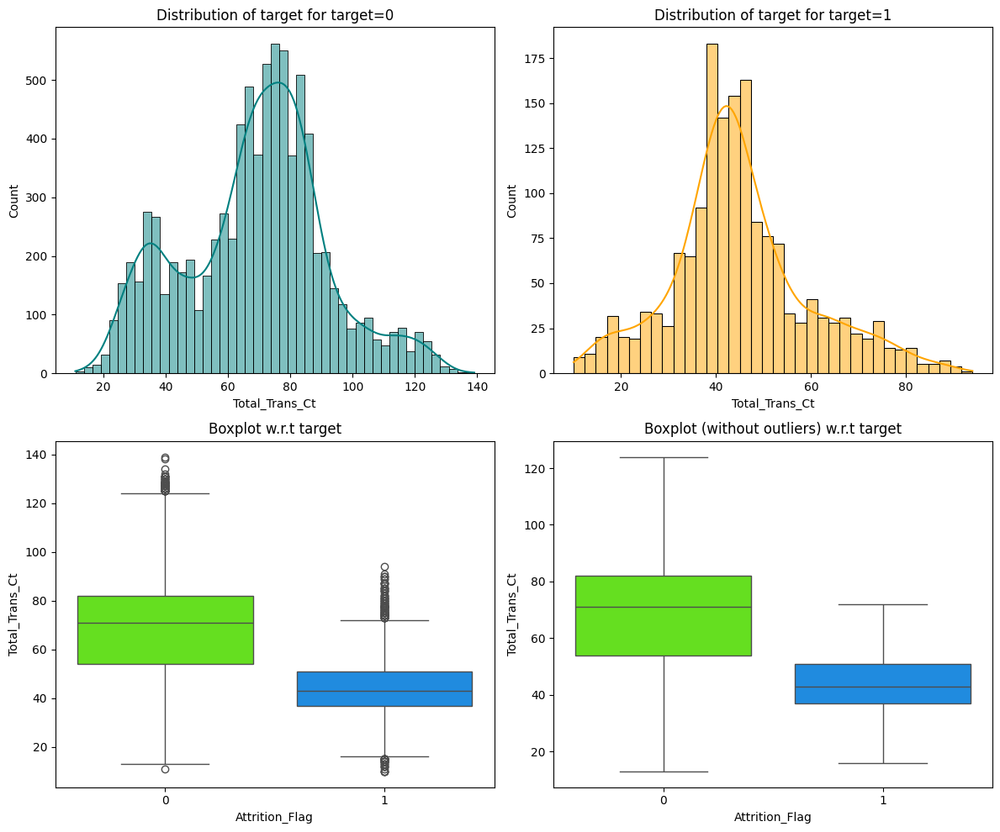

In [51]:

distribution_plot_wrt_target(df ,"Total_Trans_Ct" , "Attrition_Flag")

* Lower transaction count in last 12 months likely to attrite more .


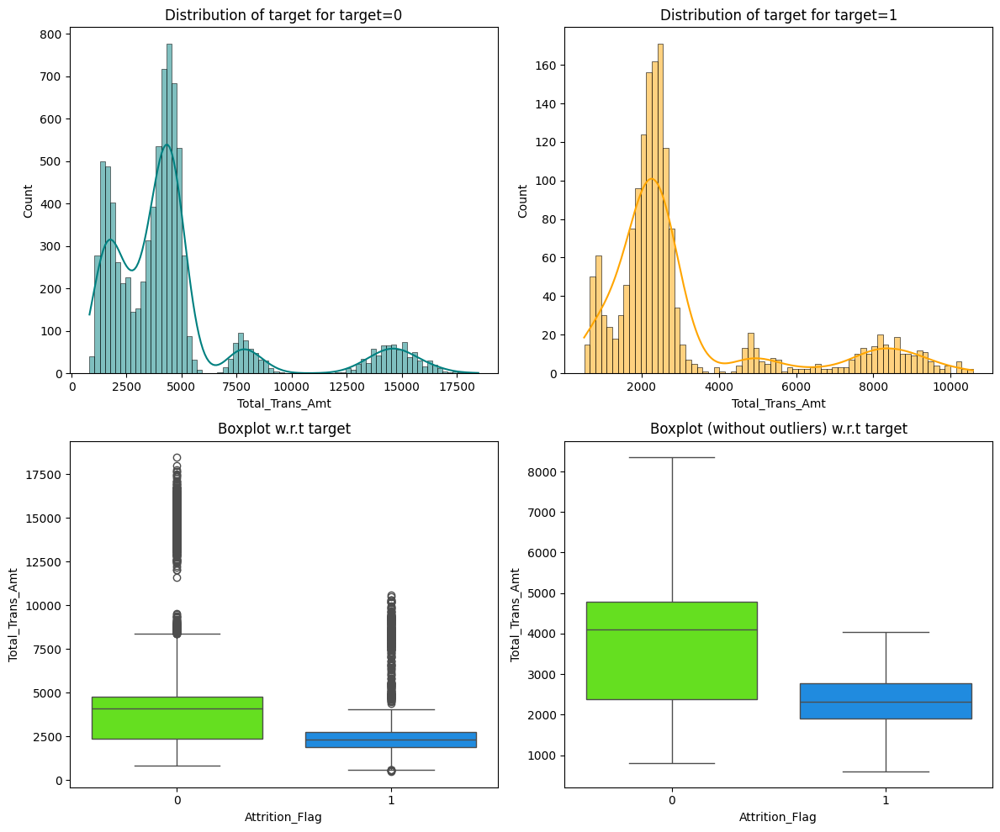

In [52]:
distribution_plot_wrt_target(df ,"Total_Trans_Amt" , "Attrition_Flag")

* Same like total transaction count , customers who has lower total Transaction Count (Last 12 months) likely to attrite more .

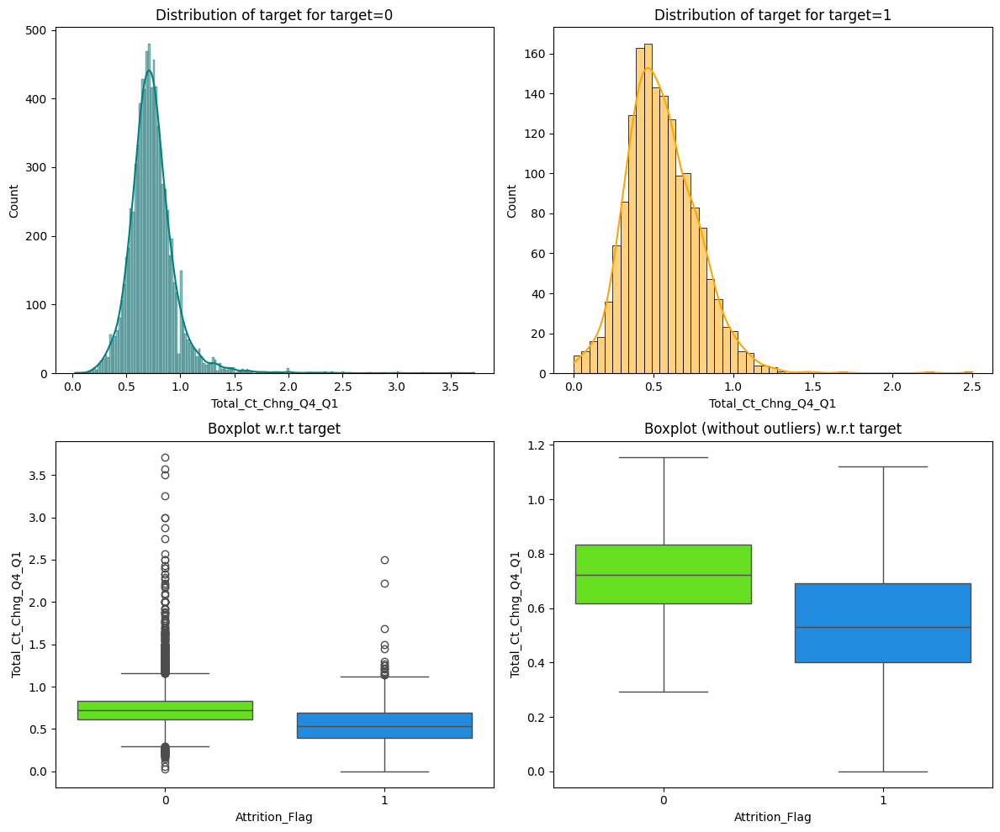

In [53]:
distribution_plot_wrt_target(df ,"Total_Ct_Chng_Q4_Q1" , "Attrition_Flag")

* Customers who has lower Change in Transaction Count (Q4 over Q1) are likley to attrite .


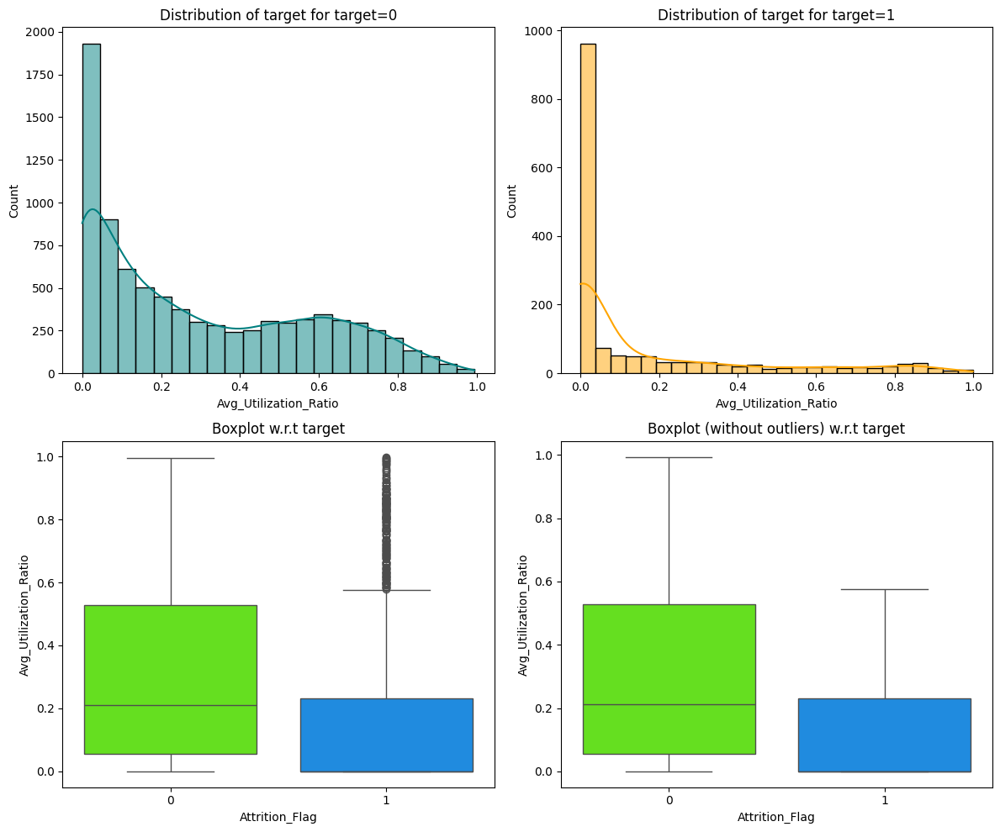

In [54]:
distribution_plot_wrt_target(df ,"Avg_Utilization_Ratio" , "Attrition_Flag")

* Customers who attrite generally have lesser avg utilization ratio

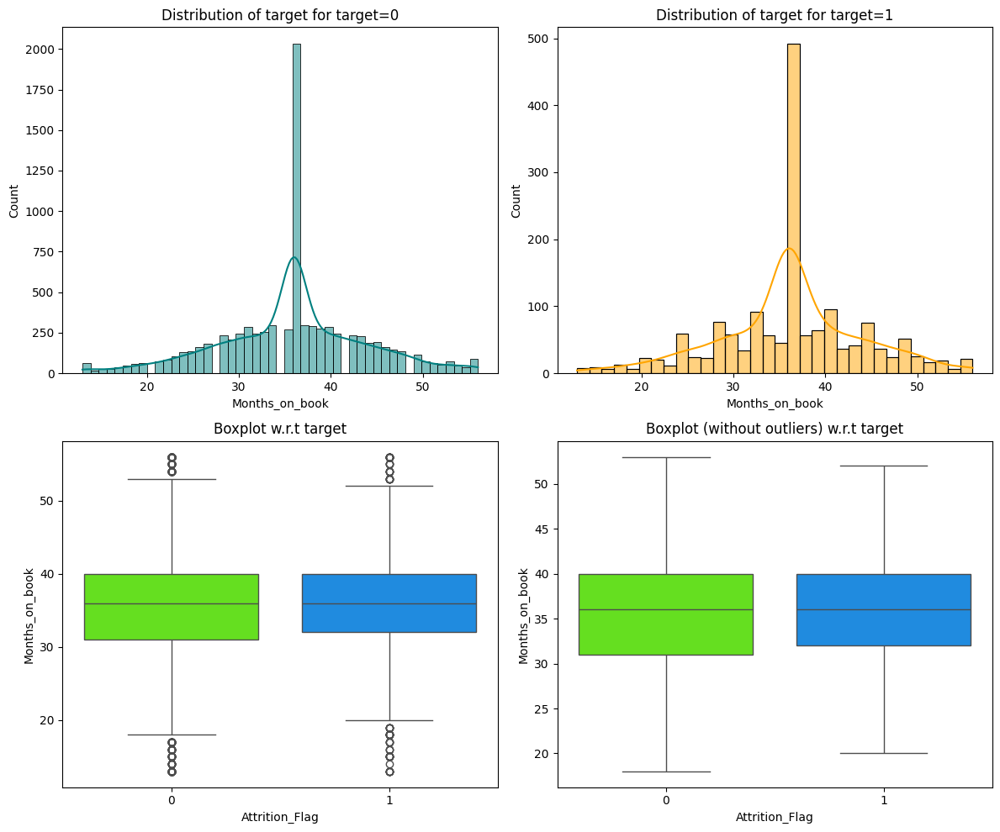

In [55]:
distribution_plot_wrt_target(df ,"Months_on_book" , "Attrition_Flag")

* Months on book don't seem to have any impact on the target variable.

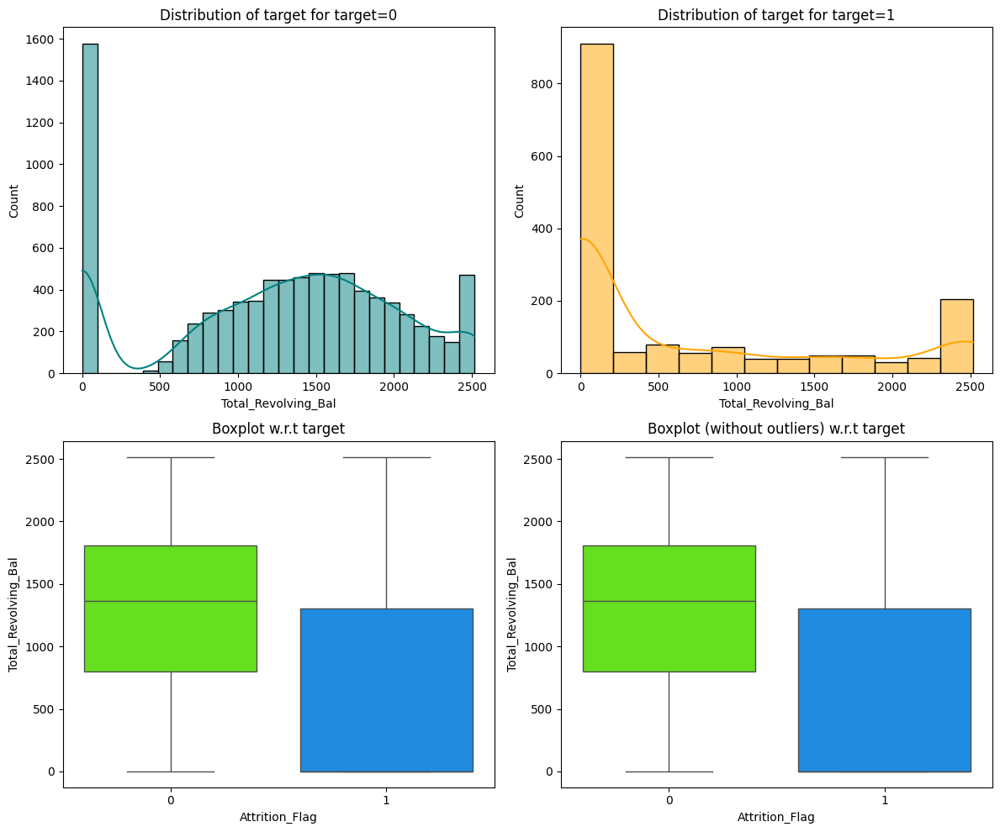

In [56]:
distribution_plot_wrt_target(df ,"Total_Revolving_Bal" , "Attrition_Flag")

* Customers who has high revolving balance would be less likely to attrite as compared to the customers who has less revolving balance.
* Customers who pays full balance of the revolving credit account is likely to attrite more .

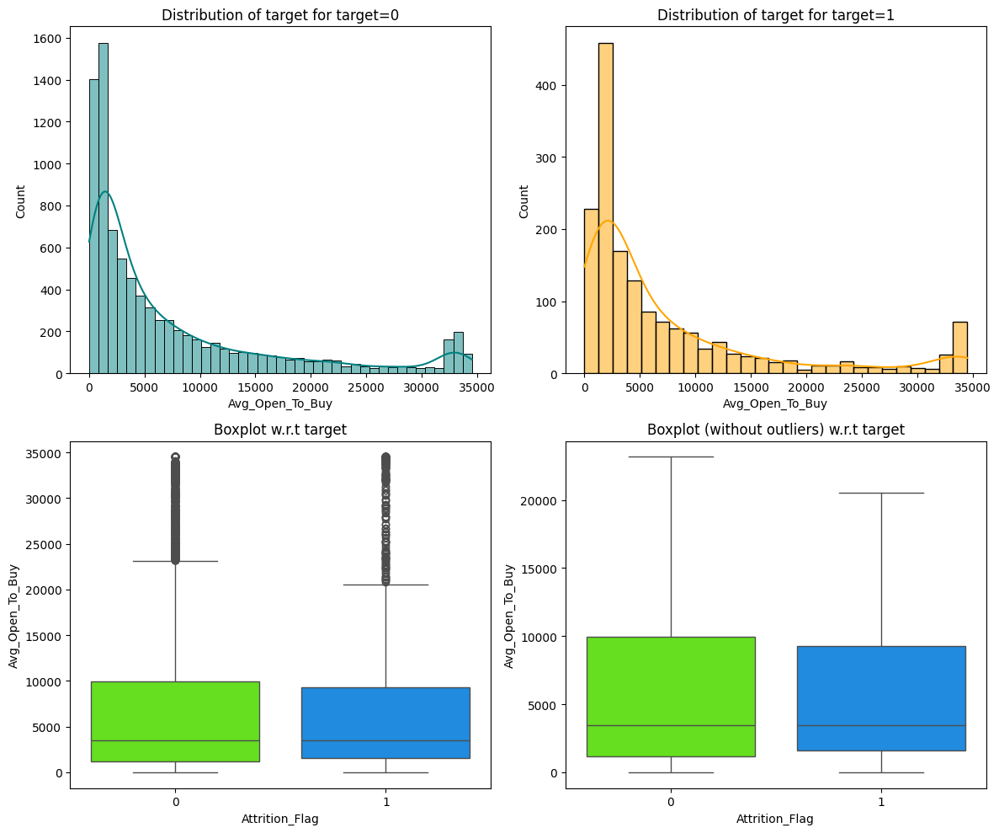

In [57]:
distribution_plot_wrt_target(df ,"Avg_Open_To_Buy" , "Attrition_Flag")

* Open to Buy Credit Line (Average of last 12 months) don't seem to have any impact on the target variable.

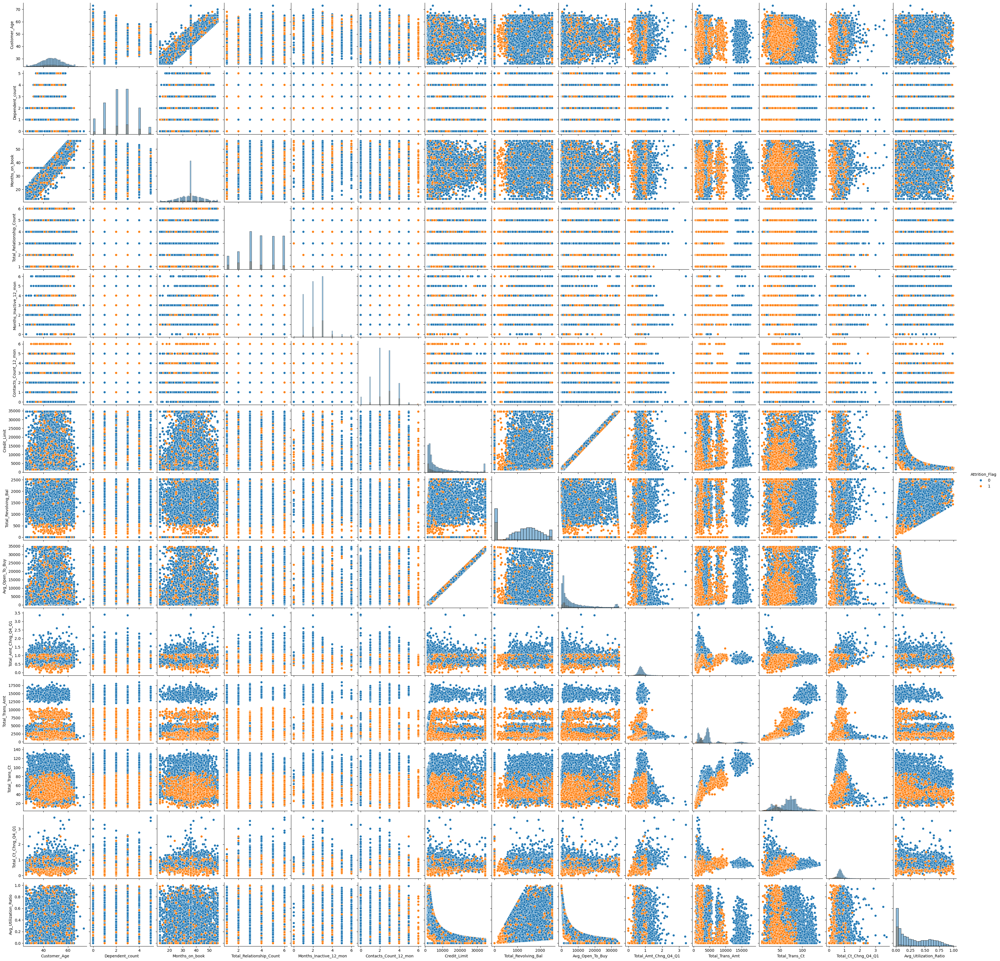

In [191]:
sns.pairplot(df, hue = 'Attrition_Flag' , diag_kind='hist')

## Data Pre-processing

# Outlier Detection

In [59]:
Q1 = df.quantile(0.25)  # To find the 25th percentile
Q3 = df.quantile(0.75)  # To find the 75th percentile

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

# Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower = (Q1 - 1.5 * IQR)
upper = (Q3 + 1.5 * IQR)

In [60]:
((df.select_dtypes(include=["float64", "int64"]) < lower) | (df.select_dtypes(include=["float64", "int64"]) > upper)).sum() / len(df) * 100

Attrition_Flag             16.066
Customer_Age                0.020
Dependent_count             0.000
Months_on_book              3.812
Total_Relationship_Count    0.000
Months_Inactive_12_mon      3.268
Contacts_Count_12_mon       6.211
Credit_Limit                9.717
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             9.509
Total_Amt_Chng_Q4_Q1        3.910
Total_Trans_Amt             8.848
Total_Trans_Ct              0.020
Total_Ct_Chng_Q4_Q1         3.891
Avg_Utilization_Ratio       0.000
dtype: float64

* As we can see above ,  avg open to buy has highest outliers after attrition flag .

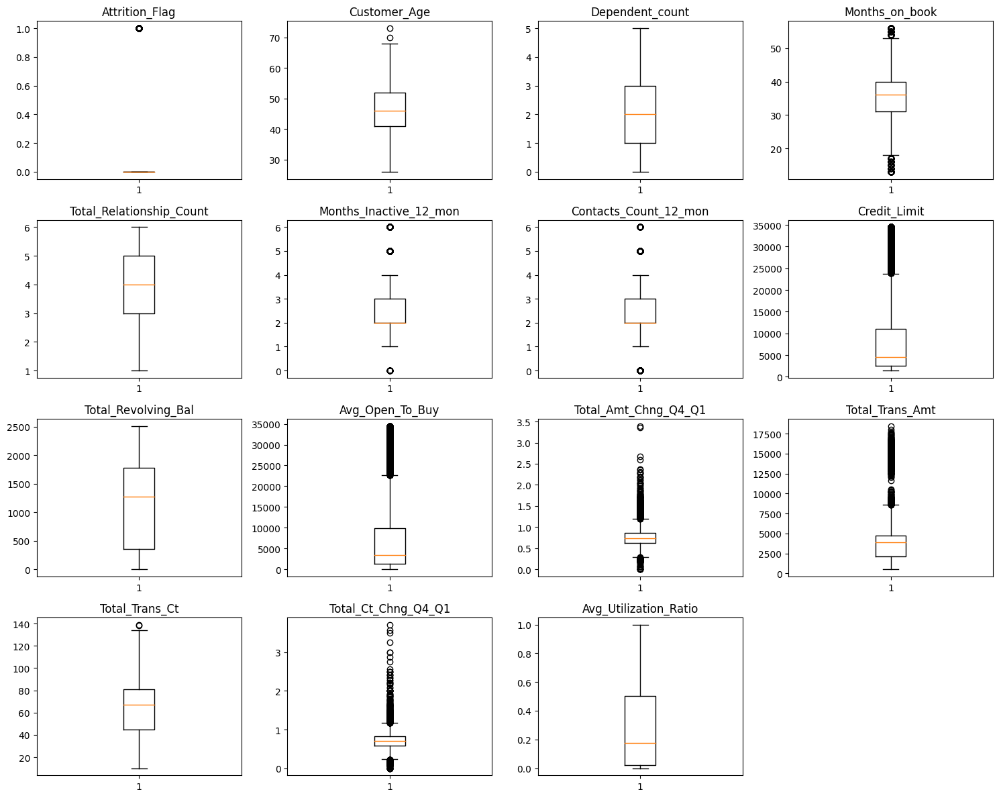

In [61]:
# outlier detection using boxplot
numeric_columns = df.select_dtypes(include=np.number).columns.tolist()


plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

* There are quite a few outliers in the data.
* However, we will not treat them as they are proper values.

# Train-Test Split


In [62]:
# creating the copy of the dataframe
df1 = df.copy()

In [63]:
df1["Income_Category"].replace("abc", np.nan, inplace=True)

In [64]:
df1.isna().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category             1112
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

* All "abc" changed to nan
* We have total count of an in Education_Level (1519) , Marital_Status(749) and Income_Category(1112)

In [65]:
# creating an instace of the imputer to be used
imputer = SimpleImputer(strategy="most_frequent")

In [66]:
# Dividing train data into X and y

X = df1.drop(["Attrition_Flag"], axis=1)
y = df1["Attrition_Flag"]

In [67]:
#Splitting data into training and validation set:
#first we split data into 2 parts, say temporary and train
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

# then we split the temporary set into test and validation
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp)

print(X_train.shape, X_val.shape, X_test.shape)

(8101, 19) (507, 19) (1519, 19)


In [68]:
print("Number of rows in train data =", X_train.shape[0])
print("Number of rows in validation data =", X_val.shape[0])
print("Number of rows in test data =", X_test.shape[0])

Number of rows in train data = 8101
Number of rows in validation data = 507
Number of rows in test data = 1519


## Missing value imputation




In [69]:
cat_cols = ["Education_Level", "Marital_Status", "Income_Category"]

In [70]:
# Fit and transform the train data
X_train[cat_cols] = imputer.fit_transform(X_train[cat_cols])

# Transform validation , test and train data
X_train[cat_cols] = imputer.fit_transform(X_train[cat_cols])
X_val[cat_cols] = imputer.transform(X_val[cat_cols])
X_test[cat_cols] = imputer.transform(X_test[cat_cols])


In [71]:
# Checking that no column has missing values in train, validation or test sets
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

Observations

* All missing values have been treated.

In [72]:
cols = X_train.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 30)

F    4288
M    3813
Name: Gender, dtype: int64
******************************
Graduate         3699
High School      1632
Uneducated       1187
College           817
Post-Graduate     413
Doctorate         353
Name: Education_Level, dtype: int64
******************************
Married     4376
Single      3139
Divorced     586
Name: Marital_Status, dtype: int64
******************************
Less than $40K    3740
$40K - $60K       1420
$80K - $120K      1246
$60K - $80K       1110
$120K +            585
Name: Income_Category, dtype: int64
******************************
Blue        7560
Silver       436
Gold          90
Platinum      15
Name: Card_Category, dtype: int64
******************************


In [73]:
cols = X_val.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_val[i].value_counts())
    print("*" * 30)

F    260
M    247
Name: Gender, dtype: int64
******************************
Graduate         246
High School       85
Uneducated        73
College           56
Post-Graduate     27
Doctorate         20
Name: Education_Level, dtype: int64
******************************
Married     292
Single      185
Divorced     30
Name: Marital_Status, dtype: int64
******************************
Less than $40K    228
$40K - $60K       100
$60K - $80K        75
$80K - $120K       75
$120K +            29
Name: Income_Category, dtype: int64
******************************
Blue        468
Silver       30
Gold          8
Platinum      1
Name: Card_Category, dtype: int64
******************************


In [74]:
cols = X_test.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 30)

F    4288
M    3813
Name: Gender, dtype: int64
******************************
Graduate         3699
High School      1632
Uneducated       1187
College           817
Post-Graduate     413
Doctorate         353
Name: Education_Level, dtype: int64
******************************
Married     4376
Single      3139
Divorced     586
Name: Marital_Status, dtype: int64
******************************
Less than $40K    3740
$40K - $60K       1420
$80K - $120K      1246
$60K - $80K       1110
$120K +            585
Name: Income_Category, dtype: int64
******************************
Blue        7560
Silver       436
Gold          90
Platinum      15
Name: Card_Category, dtype: int64
******************************


# Creating Dummy Variables

In [75]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(8101, 29) (507, 29) (1519, 29)


After encoding there are 29 columns.

In [76]:
# check the top 5 rows from the train dataset
X_train.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
3105,53,2,37,5,3,4,7282.000,0,7282.000,0.740,3364,69,0.816,0.000,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0
3721,44,4,37,4,3,3,5826.000,0,5826.000,0.689,3756,73,0.921,0.000,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
3389,50,3,41,4,2,2,2563.000,1860,703.000,0.680,3774,83,0.804,0.726,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0
3552,50,1,30,6,2,3,9771.000,1776,7995.000,0.460,2778,53,0.472,0.182,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0
398,55,0,49,5,3,3,3805.000,2233,1572.000,1.095,1743,27,0.929,0.587,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0


## Model Building

### Model evaluation criterion

### Model can make wrong predictions as:
1. Predicting an customer will attrite and the customer doesn't attrite
2. Predicting an customer will not attrite and the customer attrites

### Which case is more important?
* Predicting that customer will not attrite but he attrites i.e. losing on a valuable customer or asset.

### How to reduce this loss i.e need to reduce False Negatives?
* Bank wants Recall to be maximized, greater the Recall higher the chances of minimizing false negatives. Hence, the focus should be on increasing Recall or minimizing the false negatives or in other words identifying the true positives(i.e. Class 1) so that the Bank can provide incentives to control attrition rate especially for top-performers thereby optimizing the overall project cost in retaining the best talent.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [77]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

In [78]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Model Building with original data

Model building with original data

In [79]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("xgb", XGBClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))



print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9838709677419355
Random forest: 1.0
GBM: 0.8840245775729647
xgb: 1.0
Adaboost: 0.84715821812596
dtree: 1.0

Validation Performance:

Bagging: 0.8148148148148148
Random forest: 0.7530864197530864
GBM: 0.9012345679012346
xgb: 0.9382716049382716
Adaboost: 0.8641975308641975
dtree: 0.8024691358024691


In [80]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_train = recall_score(y_train, model.predict(X_train))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference1 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference1))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9839, Validation Score: 0.8148, Difference: 0.1691
Random forest: Training Score: 1.0000, Validation Score: 0.7531, Difference: 0.2469
GBM: Training Score: 0.8840, Validation Score: 0.9012, Difference: -0.0172
xgb: Training Score: 1.0000, Validation Score: 0.9383, Difference: 0.0617
Adaboost: Training Score: 0.8472, Validation Score: 0.8642, Difference: -0.0170
dtree: Training Score: 1.0000, Validation Score: 0.8025, Difference: 0.1975


### Model Building with Oversampled data


In [81]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [82]:
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 'Yes': 1302
Before Oversampling, counts of label 'No': 6799 

After Oversampling, counts of label 'Yes': 6799
After Oversampling, counts of label 'No': 6799 

After Oversampling, the shape of train_X: (13598, 29)
After Oversampling, the shape of train_y: (13598,) 



In [83]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("xgb", XGBClassifier(random_state=1, verbosity = 0)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.9986762759229298
Random forest: 1.0
GBM: 0.9810266215619944
Adaboost: 0.9670539785262539
dtree: 1.0
xgb: 1.0

Validation Performance:

Bagging: 0.8765432098765432
Random forest: 0.8888888888888888
GBM: 0.9382716049382716
Adaboost: 0.8888888888888888
dtree: 0.8024691358024691
xgb: 0.9506172839506173


In [84]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_train = recall_score(y_train_over, model.predict(X_train_over))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9987, Validation Score: 0.8765, Difference: 0.1221
Random forest: Training Score: 1.0000, Validation Score: 0.8889, Difference: 0.1111
GBM: Training Score: 0.9810, Validation Score: 0.9383, Difference: 0.0428
Adaboost: Training Score: 0.9671, Validation Score: 0.8889, Difference: 0.0782
dtree: Training Score: 1.0000, Validation Score: 0.8025, Difference: 0.1975
xgb: Training Score: 1.0000, Validation Score: 0.9506, Difference: 0.0494


### Model Building with Undersampled data

In [85]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [86]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 1302
Before Under Sampling, counts of label 'No': 6799 

After Under Sampling, counts of label 'Yes': 1302
After Under Sampling, counts of label 'No': 1302 

After Under Sampling, the shape of train_X: (2604, 29)
After Under Sampling, the shape of train_y: (2604,) 



In [87]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("xgb", XGBClassifier(random_state=1, verbosity = 0)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.9946236559139785
Random forest: 1.0
GBM: 0.9823348694316436
Adaboost: 0.9516129032258065
dtree: 1.0
xgb: 1.0

Validation Performance:

Bagging: 0.9382716049382716
Random forest: 0.9506172839506173
GBM: 0.9382716049382716
Adaboost: 0.9506172839506173
dtree: 0.9135802469135802
xgb: 0.9753086419753086


In [88]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_train = recall_score(y_train_un, model.predict(X_train_un))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference3 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference3))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9946, Validation Score: 0.9383, Difference: 0.0564
Random forest: Training Score: 1.0000, Validation Score: 0.9506, Difference: 0.0494
GBM: Training Score: 0.9823, Validation Score: 0.9383, Difference: 0.0441
Adaboost: Training Score: 0.9516, Validation Score: 0.9506, Difference: 0.0010
dtree: Training Score: 1.0000, Validation Score: 0.9136, Difference: 0.0864
xgb: Training Score: 1.0000, Validation Score: 0.9753, Difference: 0.0247


### HyperparameterTuning

#### Sample Parameter Grids

**Hyperparameter tuning can take a long time to run, so to avoid that time complexity - you can use the following grids, wherever required.**

- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(75,150,25),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "subsample":[0.5,0.7,1],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
     "n_estimators": np.arange(10, 110, 10),
     "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
     "base_estimator": [
         DecisionTreeClassifier(max_depth=1, random_state=1),
         DecisionTreeClassifier(max_depth=2, random_state=1),
         DecisionTreeClassifier(max_depth=3, random_state=1),
    ]
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [200,250,300],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost:

```
param_grid={
   'n_estimators':np.arange(50,300,50),
   'scale_pos_weight':[0,1,2,5,10],
   'learning_rate':[0.01,0.1,0.2,0.05],
   'gamma':[0,1,3,5],
   'subsample':[0.7,0.8,0.9,1]
}
```

#### Tuning method for Ada Boost with original data

In [89]:
%%time

# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 1, 'base_estimator': DecisionTreeClassifier(max_depth=2, random_state=1)} with CV score=0.8893427645151781:
CPU times: user 5.07 s, sys: 573 ms, total: 5.64 s
Wall time: 3min 52s


In [90]:
tuned_adb = AdaBoostClassifier(
    random_state=1,
    n_estimators=100,
    learning_rate=1,
    base_estimator=DecisionTreeClassifier(max_depth=2, random_state=1),
)
tuned_adb.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                         random_state=1),
                   learning_rate=1, n_estimators=100, random_state=1)

In [91]:
# Checking model's performance on training set
adb_train = model_performance_classification_sklearn(tuned_adb, X_train, y_train)
adb_train

,Accuracy,Recall,Precision,F1
0,0.993,0.975,0.982,0.978


In [92]:
# Checking model's performance on validation set
adb_val = model_performance_classification_sklearn(tuned_adb, X_val, y_val)
adb_val

,Accuracy,Recall,Precision,F1
0,0.982,0.914,0.974,0.943


#### Tuning method for Gradient Boost with original data

In [93]:
%%time

#Creating pipeline
Model = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(75,150,25),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "subsample":[0.5,0.7,1],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 125, 'max_features': 0.7, 'learning_rate': 0.2, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.8671087533156498:
CPU times: user 5.68 s, sys: 590 ms, total: 6.27 s
Wall time: 4min 7s


In [94]:
tuned_gbm = GradientBoostingClassifier(
    subsample=0.7,
    n_estimators=125,
    max_features=0.7,
    learning_rate=0.2,
    init=AdaBoostClassifier(random_state=1),
)
tuned_gbm.fit(X_train, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.2, max_features=0.7,
                           n_estimators=125, subsample=0.7)

In [95]:
# Checking model's performance on training set
gbm_train = model_performance_classification_sklearn(
    tuned_gbm, X_train, y_train)

gbm_train

,Accuracy,Recall,Precision,F1
0,0.988,0.949,0.976,0.963


In [96]:
# Checking model's performance on validation set
gbm_val = model_performance_classification_sklearn(tuned_gbm, X_val, y_val)
gbm_val

,Accuracy,Recall,Precision,F1
0,0.982,0.926,0.962,0.943


#### Tuning method for XG Boost with original data

In [97]:
%%time

# defining model
Model = XGBClassifier(random_state=1,eval_metric='logloss')

#Parameter grid to pass in RandomSearchCV
param_grid={
   'n_estimators':np.arange(50,300,50),
   'scale_pos_weight':[0,1,2,5,10],
   'learning_rate':[0.01,0.1,0.2,0.05],
   'gamma':[0,1,3,5],
   'subsample':[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train) ## Complete the code to fit the model on original data

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 10, 'n_estimators': 200, 'learning_rate': 0.01, 'gamma': 1} with CV score=0.9515974064249928:
CPU times: user 4.22 s, sys: 311 ms, total: 4.53 s
Wall time: 1min 14s


In [98]:
tuned_xgb = XGBClassifier(
    subsample=0.9,
    scale_pos_weight=10,
    n_estimators=200,
    gamma=1,
    learning_rate=0.01,
)
tuned_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [99]:
# Checking model's performance on training set
xgb_train = model_performance_classification_sklearn(
    tuned_xgb, X_train, y_train)

xgb_train

,Accuracy,Recall,Precision,F1
0,0.939,0.998,0.726,0.841


In [100]:
# Checking model's performance on validation set
xgb_val = model_performance_classification_sklearn(tuned_xgb, X_val, y_val)
xgb_val

,Accuracy,Recall,Precision,F1
0,0.925,0.963,0.690,0.804


#### Tuning method for Bagging with original data

In [139]:
%%time

# defining model
Model = BaggingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train) ## Complete the code to fit the model on original data

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 70, 'max_samples': 0.9, 'max_features': 0.9} with CV score=0.8448246389625702:
CPU times: user 5.73 s, sys: 390 ms, total: 6.12 s
Wall time: 2min 55s


In [142]:
tuned_bagging = BaggingClassifier(
    max_samples=0.9,
    max_features=0.9,
    n_estimators=70,
)
tuned_bagging.fit(X_train, y_train)

BaggingClassifier(max_features=0.9, max_samples=0.9, n_estimators=70)

In [143]:
# Checking model's performance on training set
bagging_train = model_performance_classification_sklearn(
    tuned_bagging, X_train, y_train)

bagging_train

,Accuracy,Recall,Precision,F1
0,1.000,0.999,1.000,1.000


In [144]:
# Checking model's performance on validation set
bagging_val = model_performance_classification_sklearn(tuned_bagging, X_val, y_val)
bagging_val

,Accuracy,Recall,Precision,F1
0,0.970,0.877,0.934,0.904


#### Tuning method for Adaboost with oversampled data

In [145]:
%%time

# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over, y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 90, 'learning_rate': 0.2, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.949852075488032:
CPU times: user 9.12 s, sys: 972 ms, total: 10.1 s
Wall time: 6min 43s


In [148]:
tuned_adb_over = AdaBoostClassifier(
    random_state=1,
    n_estimators=90,
    learning_rate=0.2,
    base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
)
tuned_adb_over.fit(X_train_over, y_train_over)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.2, n_estimators=90, random_state=1)

In [149]:
# Checking model's performance on training set
adb_train_over = model_performance_classification_sklearn(tuned_adb_over, X_train_over, y_train_over)
adb_train_over

,Accuracy,Recall,Precision,F1
0,0.990,0.991,0.989,0.990


In [150]:
# Checking model's performance on validation set
adb_val_over = model_performance_classification_sklearn(tuned_adb_over, X_val, y_val)
adb_val_over

,Accuracy,Recall,Precision,F1
0,0.986,0.951,0.963,0.957


#### Tuning method for GradientBoost with oversampled data

In [151]:
%%time

#Creating pipeline
Model = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(75,150,25),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "subsample":[0.5,0.7,1],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.5, 'learning_rate': 0.2, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9519108990174436:
CPU times: user 8.23 s, sys: 1.03 s, total: 9.26 s
Wall time: 6min 51s


In [152]:
tuned_gbm_over = GradientBoostingClassifier(
    subsample=0.7,
    n_estimators=100,
    max_features=0.5,
    learning_rate=0.2,
    init=AdaBoostClassifier(random_state=1),
)
tuned_gbm_over.fit(X_train_over, y_train_over)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.2, max_features=0.5, subsample=0.7)

In [153]:
# Checking model's performance on training set
gbm_train_over = model_performance_classification_sklearn(
    tuned_gbm_over, X_train, y_train)

gbm_train_over

,Accuracy,Recall,Precision,F1
0,0.978,0.948,0.918,0.933


In [154]:
# Checking model's performance on validation set
gbm_val_over = model_performance_classification_sklearn(tuned_gbm_over, X_val, y_val)
gbm_val_over

,Accuracy,Recall,Precision,F1
0,0.982,0.951,0.939,0.945


#### Tuning method for XGBoost with oversampled data

In [155]:
%%time

# defining model
Model = XGBClassifier(random_state=1,eval_metric='logloss')

#Parameter grid to pass in RandomSearchCV
param_grid={
   'n_estimators':np.arange(50,300,50),
   'scale_pos_weight':[0,1,2,5,10],
   'learning_rate':[0.01,0.1,0.2,0.05],
   'gamma':[0,1,3,5],
   'subsample':[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over) ## Complete the code to fit the model on original data

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 10, 'n_estimators': 200, 'learning_rate': 0.01, 'gamma': 1} with CV score=0.9939701553910748:
CPU times: user 4.37 s, sys: 445 ms, total: 4.81 s
Wall time: 2min 15s


In [156]:
tuned_xgb_over = XGBClassifier(
    subsample=0.9,
    scale_pos_weight=10,
    n_estimators=200,
    gamma=1,
    learning_rate=0.01,
)
tuned_xgb_over.fit(X_train_over,y_train_over)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [157]:
# Checking model's performance on training set
xgb_train_over = model_performance_classification_sklearn(
    tuned_xgb_over, X_train_over,y_train_over)

xgb_train_over

,Accuracy,Recall,Precision,F1
0,0.927,1.000,0.873,0.932


In [159]:
# Checking model's performance on validation set
xgb_val_over = model_performance_classification_sklearn(tuned_xgb_over, X_val, y_val)
xgb_val_over

,Accuracy,Recall,Precision,F1
0,0.858,1.000,0.529,0.692


#### Tuning method for Bagging with oversampled data

In [160]:
%%time

# defining model
Model = BaggingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over) ## Complete the code to fit the model on original data

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 50, 'max_samples': 1, 'max_features': 0.7} with CV score=1.0:
CPU times: user 2.96 s, sys: 518 ms, total: 3.48 s
Wall time: 3min 59s


In [161]:
tuned_bagging_over = BaggingClassifier(
    max_samples=1,
    max_features=0.7,
    n_estimators=50,
)
tuned_bagging_over.fit(X_train_over,y_train_over)

BaggingClassifier(max_features=0.7, max_samples=1, n_estimators=50)

In [190]:
# Checking model's performance on training set
bagging_train_over = model_performance_classification_sklearn(
    tuned_bagging_over, X_train_over,y_train_over)

bagging_train_over

,Accuracy,Recall,Precision,F1
0,0.500,0.000,0.000,0.000


In [163]:
# Checking model's performance on validation set
bagging_val_over = model_performance_classification_sklearn(tuned_bagging_over, X_val, y_val)
bagging_val_over

,Accuracy,Recall,Precision,F1
0,0.840,0.000,0.000,0.000


#### Tuning method for AdaBoost with undersampled data

In [164]:
%%time

# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 90, 'learning_rate': 0.2, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.954692012967875:
CPU times: user 2.5 s, sys: 249 ms, total: 2.75 s
Wall time: 1min 33s


In [165]:
tuned_adb_un = AdaBoostClassifier(
    random_state=1,
    n_estimators=90,
    learning_rate=0.2,
    base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
)
tuned_adb_un.fit(X_train_un, y_train_un)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.2, n_estimators=90, random_state=1)

In [166]:
# Checking model's performance on training set
adb_train_un = model_performance_classification_sklearn(tuned_adb_un, X_train_un, y_train_un)
adb_train_un

,Accuracy,Recall,Precision,F1
0,0.999,1.000,0.998,0.999


In [167]:
# Checking model's performance on validation set
adb_val_un = model_performance_classification_sklearn(tuned_adb_un, X_val, y_val)
adb_val_un

,Accuracy,Recall,Precision,F1
0,0.947,0.951,0.770,0.851


#### Tuning method for GradientBoost with undersampled data

In [168]:
%%time

#Creating pipeline
Model = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(75,150,25),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "subsample":[0.5,0.7,1],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 125, 'max_features': 0.7, 'learning_rate': 0.2, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9523902151488359:
CPU times: user 2.88 s, sys: 262 ms, total: 3.14 s
Wall time: 1min 46s


In [169]:
tuned_gbm_un = GradientBoostingClassifier(
    subsample=0.7,
    n_estimators=125,
    max_features=0.7,
    learning_rate=0.2,
    init=AdaBoostClassifier(random_state=1),
)
tuned_gbm_un.fit(X_train_un, y_train_un)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.2, max_features=0.7,
                           n_estimators=125, subsample=0.7)

In [170]:
# Checking model's performance on training set
gbm_train_un = model_performance_classification_sklearn(
    tuned_gbm_un, X_train_un, y_train_un)

gbm_train_un

,Accuracy,Recall,Precision,F1
0,0.997,0.998,0.995,0.997


In [171]:
# Checking model's performance on validation set
gbm_val_un = model_performance_classification_sklearn(tuned_gbm_un, X_val, y_val)
gbm_val_un

,Accuracy,Recall,Precision,F1
0,0.961,0.963,0.821,0.886


#### Tuning method for XGBoost with undersampled data

In [172]:
%%time

# defining model
Model = XGBClassifier(random_state=1,eval_metric='logloss')

#Parameter grid to pass in RandomSearchCV
param_grid={
   'n_estimators':np.arange(50,300,50),
   'scale_pos_weight':[0,1,2,5,10],
   'learning_rate':[0.01,0.1,0.2,0.05],
   'gamma':[0,1,3,5],
   'subsample':[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un) ## Complete the code to fit the model on original data

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 2, 'n_estimators': 50, 'learning_rate': 0.01, 'gamma': 1} with CV score=0.987709991158267:
CPU times: user 1.55 s, sys: 143 ms, total: 1.7 s
Wall time: 45.8 s


In [173]:
tuned_xgb_un = XGBClassifier(
    subsample=0.7,
    scale_pos_weight=2,
    n_estimators=50,
    gamma=1,
    learning_rate=0.01,
)
tuned_xgb_un.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [174]:
# Checking model's performance on training set
xgb_train_un = model_performance_classification_sklearn(
    tuned_xgb_un, X_train_un, y_train_un)

xgb_train_un

,Accuracy,Recall,Precision,F1
0,0.901,0.999,0.836,0.910


In [175]:
# Checking model's performance on validation set
xgb_val_un = model_performance_classification_sklearn(tuned_xgb_un, X_val, y_val)
xgb_val_un

,Accuracy,Recall,Precision,F1
0,0.785,1.000,0.426,0.598


#### Tuning method for Bagging with undersampled data

In [176]:
%%time

# defining model
Model = BaggingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un) ## Complete the code to fit the model on original data

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 30, 'max_samples': 1, 'max_features': 0.7} with CV score=1.0:
CPU times: user 827 ms, sys: 122 ms, total: 949 ms
Wall time: 45.6 s


In [177]:
tuned_bagging_un = BaggingClassifier(
    max_samples=1,
    max_features=0.7,
    n_estimators=30,
)
tuned_bagging_un.fit(X_train_un, y_train_un)

BaggingClassifier(max_features=0.7, max_samples=1, n_estimators=30)

In [178]:
# Checking model's performance on training set
bagging_train_un = model_performance_classification_sklearn(
    tuned_bagging_un, X_train_un, y_train_un)

bagging_train_un

,Accuracy,Recall,Precision,F1
0,0.500,0.000,0.000,0.000


In [179]:
# Checking model's performance on validation set
bagging_val_un = model_performance_classification_sklearn(tuned_bagging_un, X_val, y_val)
bagging_val_un

,Accuracy,Recall,Precision,F1
0,0.840,0.000,0.000,0.000


## Model Comparison and Final Model Selection

In [180]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        adb_train.T,
        adb_train_over.T,
        adb_train_un.T,
        gbm_train.T,
        gbm_train_over.T,
        gbm_train_un.T,
        xgb_train.T,
        xgb_train_over.T,
        xgb_train_un.T,
        bagging_train.T,
        bagging_train_over.T,
        bagging_train_un.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "AdaBoost trained with Original data",
    "AdaBoost trained with Oversampled data",
    "AdaBoost  trained with Undersampled data",
    "GradientBoost trained with Original data",
    "GradientBoost trained with Oversampled data",
    "GradientBoost  trained with Undersampled data",
    "XGBoost trained with Original data",
    "XGBoost trained with Oversampled data",
     "XGBoost  trained with Undersampled data",
    "Bagging trained with Original data",
    "Bagging trained with Oversampled data",
     "Bagging  trained with Undersampled data",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,AdaBoost trained with Original data,AdaBoost trained with Oversampled data,AdaBoost trained with Undersampled data,GradientBoost trained with Original data,GradientBoost trained with Oversampled data,GradientBoost trained with Undersampled data,XGBoost trained with Original data,XGBoost trained with Oversampled data,XGBoost trained with Undersampled data,Bagging trained with Original data,Bagging trained with Oversampled data,Bagging trained with Undersampled data
Accuracy,0.993,0.990,0.999,0.988,0.978,0.997,0.939,0.927,0.901,1.000,0.500,0.500
Recall,0.975,0.991,1.000,0.949,0.948,0.998,0.998,1.000,0.999,0.999,0.000,0.000
Precision,0.982,0.989,0.998,0.976,0.918,0.995,0.726,0.873,0.836,1.000,0.000,0.000
F1,0.978,0.990,0.999,0.963,0.933,0.997,0.841,0.932,0.910,1.000,0.000,0.000


In [181]:
# Validation performance comparison

models_train_comp_df = pd.concat(
    [
        adb_val.T,
        adb_val_over.T,
        adb_val_un.T,
        gbm_val.T,
        gbm_val_over.T,
        gbm_val_un.T,
        xgb_val.T,
        xgb_val_over.T,
        xgb_val_un.T,
        bagging_val.T,
        bagging_val_over.T,
        bagging_val_un.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "AdaBoost trained with Original data",
    "AdaBoost trained with Oversampled data",
    "AdaBoost  trained with Undersampled data",
    "GradientBoost trained with Original data",
    "GradientBoost trained with Oversampled data",
    "GradientBoost  trained with Undersampled data",
    "XGBoost trained with Original data",
    "XGBoost trained with Oversampled data",
     "XGBoost  trained with Undersampled data",
    "Bagging trained with Original data",
    "Bagging trained with Oversampled data",
     "Bagging  trained with Undersampled data",
]
print("Validation performance comparison:")
models_train_comp_df

Validation performance comparison:


,AdaBoost trained with Original data,AdaBoost trained with Oversampled data,AdaBoost trained with Undersampled data,GradientBoost trained with Original data,GradientBoost trained with Oversampled data,GradientBoost trained with Undersampled data,XGBoost trained with Original data,XGBoost trained with Oversampled data,XGBoost trained with Undersampled data,Bagging trained with Original data,Bagging trained with Oversampled data,Bagging trained with Undersampled data
Accuracy,0.982,0.986,0.947,0.982,0.982,0.961,0.925,0.858,0.785,0.970,0.840,0.840
Recall,0.914,0.951,0.951,0.926,0.951,0.963,0.963,1.000,1.000,0.877,0.000,0.000
Precision,0.974,0.963,0.770,0.962,0.939,0.821,0.690,0.529,0.426,0.934,0.000,0.000
F1,0.943,0.957,0.851,0.943,0.945,0.886,0.804,0.692,0.598,0.904,0.000,0.000


Observations

* GradientBoost model trained with Original data has generalised performance, so will consider it as the best model.



### Test set final performance

In [186]:
# Let's check the performance on test set
gbm_test = model_performance_classification_sklearn(tuned_gbm, X_test, y_test)
gbm_test

,Accuracy,Recall,Precision,F1
0,0.979,0.934,0.934,0.934


- The GradientBoost model trained with Original data has given ~93% recall on the test set
- This performance is in line with what we achieved with this model on the train and validation sets
- So, this is a generalized model
- The model is giving a generalized result now since the recall scores on both the train and Validation data are coming to be around 0.93 which shows that the model is able to generalize well on unseen data.

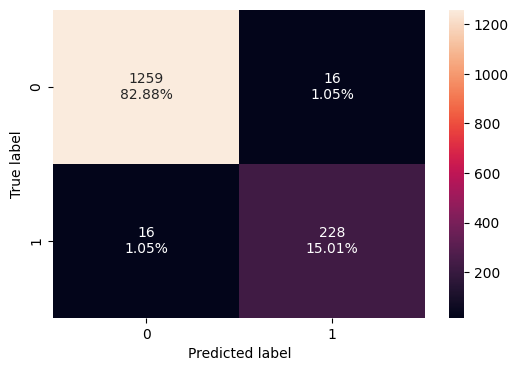

In [189]:
confusion_matrix_sklearn(tuned_gbm, X_test,y_test)

In [187]:
print (pd.DataFrame(tuned_gbm.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                 Imp
Total_Trans_Ct                 0.285
Total_Trans_Amt                0.235
Total_Ct_Chng_Q4_Q1            0.118
Total_Revolving_Bal            0.092
Total_Relationship_Count       0.079
Avg_Utilization_Ratio          0.074
Total_Amt_Chng_Q4_Q1           0.041
Customer_Age                   0.025
Months_Inactive_12_mon         0.014
Contacts_Count_12_mon          0.012
Avg_Open_To_Buy                0.010
Months_on_book                 0.005
Credit_Limit                   0.004
Marital_Status_Married         0.001
Card_Category_Gold             0.001
Dependent_count                0.001
Gender_M                       0.001
Card_Category_Platinum         0.001
Marital_Status_Single          0.000
Card_Category_Silver           0.000
Income_Category_$60K - $80K    0.000
Education_Level_Uneducated     0.000
Education_Level_Post-Graduate  0.000
Education_Level_Doctorate      0.000
Income_Category_Less than $40K 0.000
Education_Level_Graduate       0.000
E

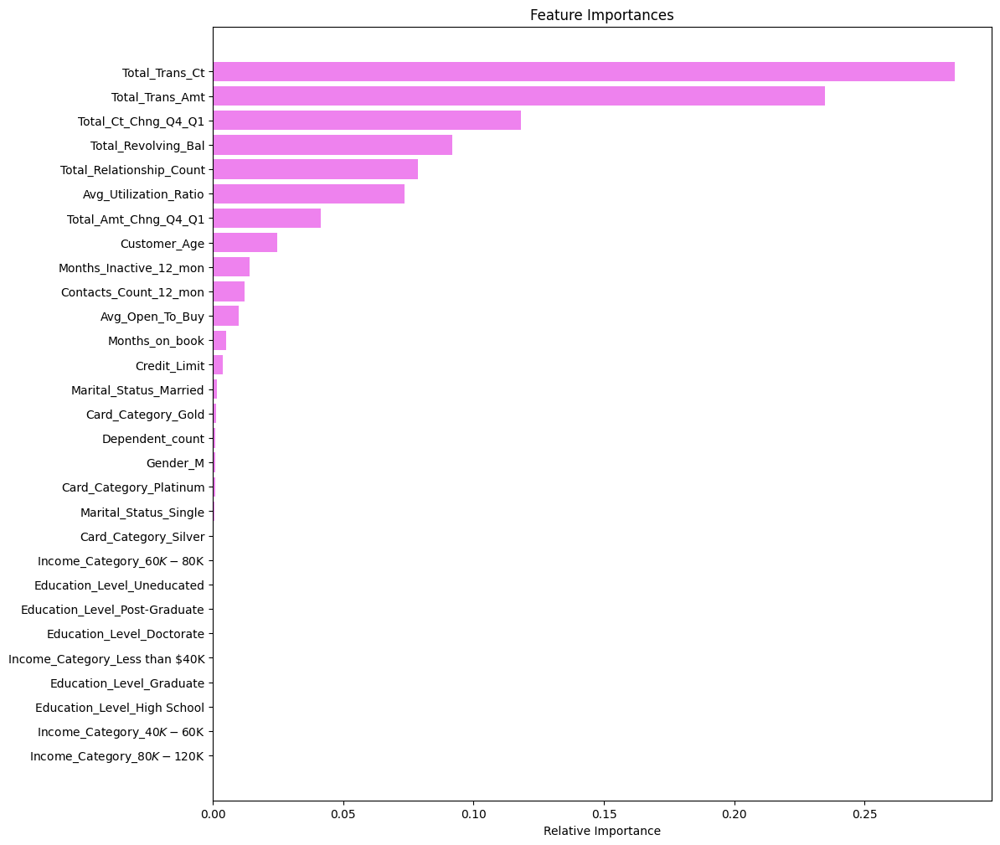

In [188]:
feature_names = X_train.columns
importances = tuned_gbm.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- We can see that below are important feature are the most important features for making predictions
     * Total_Trans_Ct
     * Total_Trans_Amt
     * Total_Ct_Chng_Q4_Q1
     * Total_revloving_balance
     * Total_Relationship_Count


# Business Insights and Conclusions

* Factors that drive attrition - Total_Trans_Ct, Total_Trans_Amt, Total_Ct_Chng_Q4_Q1 and Total_revloving_balance .
* Total_Trans_Ct : Customers with lower transactions count (12 months) attrite more . Bank should Offer incentives such as airline miles, hotel room rentals, gift certificates to major retailers, and cash back on purchases
* Total_Trans_Amt : This is same feature as above . Total transaction count and total transaction amount are highly correlated to each other
* Total_Ct_Chng_Q4_Q1 : Customers who has lower Change in Transaction Count (Q4 over Q1) are likley to attrite . It means the customers doing transactions in Q4 is lesser than Q1 .
* Total_revloving_balance : Customers who has high revolving balance would be less likely to attrite as compared to the customers who has less revolving balance . Customers who pays full balance of the revolving credit account is likely to attrite more .
* Total_Relationship_Count : Customers who held 2 or less products tends to attrite more . For customers who has two or less products , Bank should offer
credit cards which has lower taxes and benefits such as points on purchases . They can also give some promotional points on buying new credit ards .
* We have been able to build a predictive model:
  - that Bank can deploy this model to identify customers who are at the risk of attrition.
  - that bank can use to find the drivers of attrition.
  - based on which bank can take appropriate actions to build better retention policies.




***